<img src ='https://www.outlookmoney.com/resizer.php?src=https://www.outlookindia.com/outlookmoney/public/uploads/article/gallery/c8b9d2729ba7c08d542577ba85962f05.jpg&w=650'>

# Association Rule: 
- It is unsupervised learning where algorithm tries to learn without being trained/ supervised as data are not labeled.
- It is descriptive not predictive model.
- It is used to discover interesting hidden relationship in the large dataset.
- These relationship are usually represented in the form of `rules`.

### How does it work?
- Association Rule Mining is a concept which tries to find pattern (rules) in the purchasing behavour of customers.
- For example, customers buying mobile phone, need mobile phone cover, screen protector ...etc. So recommend them.
- This will enhance chance of selling mobile phone cover and screen protector.
### Apriori Algorithm :
For human being, it is difficult to find put the hidden trend. So Apriori algorithm is used to find such rules. This algorithm is computed on the basis of counting frequency of purchase and calculating few metrics known as `support`, `confidence` and `lift`.
#### - Support : (frequency of rule)
The no. of times product or multiple product are purchased out of all transaction.
- How many times mobile and mobile cover is purcahsed out of all transaction
- `If the support is high, that means the combination of product is purchases very frequently`
#### -  Confidence:
The no. of time second product is purchased after or with first product
- How many time mobile cover is purchased with or after mobile.
- 
#### Support vs Confidence :
- support low and confidence high acceptable
- support high and confidence low not acceptable

#### Lift:
It is defined a sthe ratio of support of two products being purchased together to support of both products purchased independently. 
- `Lift(A->B) = support(A,B)/ (support(A)*support(B))`
Based on the above formula we can say that:
> - if Lift $> 1$: one product is purchased then the other is likely to be purchased.
> - if Lift $< 1$: one product is purchased then the other is NOT likely to be purchased.
> - if  Lift $= 1$: There is no association.
- `In general, the higher the Lift, the higher the association between products and significant rule`

# Importing Necessary Libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

# Loading and Reading Dataset

In [2]:
dataset ='Online Retail.xlsx'
df= pd.read_excel(dataset)
df

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Total Price
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom,15.30
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom,22.00
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34
...,...,...,...,...,...,...,...,...,...
541904,581587,22613,PACK OF 20 SPACEBOY NAPKINS,12,2011-12-09 12:50:00,0.85,12680.0,France,10.20
541905,581587,22899,CHILDREN'S APRON DOLLY GIRL,6,2011-12-09 12:50:00,2.10,12680.0,France,12.60
541906,581587,23254,CHILDRENS CUTLERY DOLLY GIRL,4,2011-12-09 12:50:00,4.15,12680.0,France,16.60
541907,581587,23255,CHILDRENS CUTLERY CIRCUS PARADE,4,2011-12-09 12:50:00,4.15,12680.0,France,16.60


# Exploring dataset

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 541909 entries, 0 to 541908
Data columns (total 9 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   InvoiceNo    541909 non-null  object        
 1   StockCode    541909 non-null  object        
 2   Description  540455 non-null  object        
 3   Quantity     541909 non-null  int64         
 4   InvoiceDate  541909 non-null  datetime64[ns]
 5   UnitPrice    541909 non-null  float64       
 6   CustomerID   406829 non-null  float64       
 7   Country      541909 non-null  object        
 8   Total Price  541909 non-null  float64       
dtypes: datetime64[ns](1), float64(3), int64(1), object(4)
memory usage: 37.2+ MB


### Checking missing value

In [4]:
null=[]
for col in df.columns:
    null_percentage = (100*df[col].isna().sum()/len(df)).round(2)
    null.append((col, df[col].dtypes,null_percentage))
from tabulate import tabulate
print(tabulate(null, headers=['column name', 'column type','null percentage(%)']),)    

column name    column type       null percentage(%)
-------------  --------------  --------------------
InvoiceNo      object                          0
StockCode      object                          0
Description    object                          0.27
Quantity       int64                           0
InvoiceDate    datetime64[ns]                  0
UnitPrice      float64                         0
CustomerID     float64                        24.93
Country        object                          0
Total Price    float64                         0


### Statistical Description

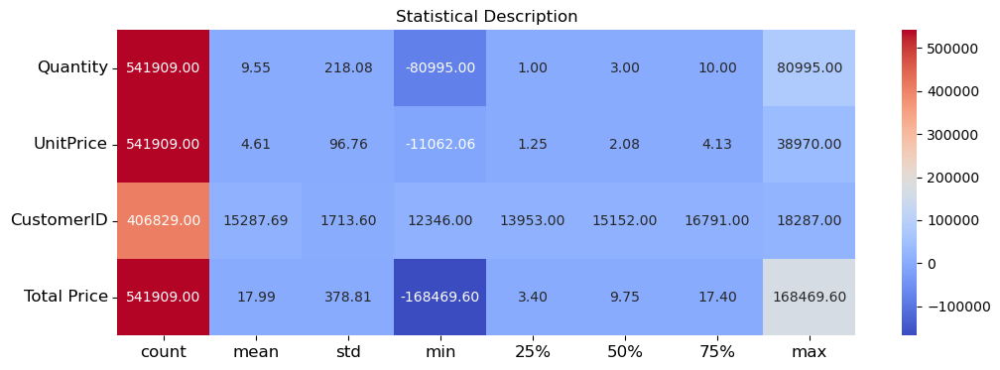

In [5]:
def heatmap(df,title = 'title', cmap = 'coolwarm', figsize=(12,4)):
   
    
    plt.figure(figsize=figsize)
    sns.heatmap(df, annot=True, cmap=cmap, fmt=".2f")
    plt.xticks(size = 12)
    plt.yticks(size = 12, rotation = 0)
    plt.title(title)
    plt.show()

desc=df.describe(include='number').T
heatmap(desc, 'Statistical Description')

In [6]:
df[['Quantity','UnitPrice','Total Price']].min()

Quantity       -80995.00
UnitPrice      -11062.06
Total Price   -168469.60
dtype: float64

# - `Total Price`

In [7]:
# Total Price is quantity * UnitPrice

df[df['Total Price']  == df['Total Price'].min()]

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Total Price
540422,C581484,23843,"PAPER CRAFT , LITTLE BIRDIE",-80995,2011-12-09 09:27:00,2.08,16446.0,United Kingdom,-168469.6


###  $Total Price = Unit Price \times Quantity$ ;  
### Total price is negative as Quantity is negative

 ### `Quantity` column in an online retail dataset is negative, it typically represents product returns, cancellations, or adjustments. Negative 'Quantity' values usually indicate that items have been returned by customers, canceled from orders, or adjusted due to errors. 

# - `UnitPrice`

In [8]:
df[df['UnitPrice']  == df['UnitPrice'].min()]

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Total Price
299983,A563186,B,Adjust bad debt,1,2011-08-12 14:51:00,-11062.06,NaN,United Kingdom,-11062.06
299984,A563187,B,Adjust bad debt,1,2011-08-12 14:52:00,-11062.06,NaN,United Kingdom,-11062.06


### - Negative `UnitPrice` values are often used to maintain consistency in accounting and reporting, especially when working with datasets that involve `refunds`, `returns`, and `adjustments`. It's important to consider the context of the dataset.

In [9]:
df[df['UnitPrice']<0]

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Total Price
299983,A563186,B,Adjust bad debt,1,2011-08-12 14:51:00,-11062.06,NaN,United Kingdom,-11062.06
299984,A563187,B,Adjust bad debt,1,2011-08-12 14:52:00,-11062.06,NaN,United Kingdom,-11062.06


### - Invoice numbers that start with the letter "A"  (A563186, A563187) might indicate Adjustments.

In [10]:
for col in df.select_dtypes(include='object').columns:
    print('====='*10)
    print(col)
    print('====='*10)
    print(df[col].unique().tolist())
    

InvoiceNo
[536365, 536366, 536367, 536368, 536369, 536370, 536371, 536372, 536373, 536374, 536375, 536376, 536377, 536378, 536380, 536381, 'C536379', 536382, 'C536383', 536384, 536385, 536386, 536387, 536388, 536389, 536390, 'C536391', 536392, 536393, 536394, 536395, 536396, 536397, 536398, 536399, 536400, 536401, 536402, 536403, 536404, 536405, 536406, 536407, 536408, 536409, 536412, 536414, 536415, 536416, 536420, 536423, 536425, 536437, 536446, 536460, 536463, 536464, 536466, 536477, 536488, 536500, 536502, 536508, 'C536506', 536514, 536520, 536521, 536522, 536523, 536524, 536525, 536526, 536527, 536528, 536529, 536530, 536531, 536532, 536533, 536534, 536535, 536536, 536537, 536538, 536539, 536540, 536541, 536542, 'C536543', 536544, 536545, 536546, 536547, 'C536548', 536549, 536550, 536551, 536552, 536553, 536554, 536555, 536556, 536557, 536558, 536559, 536560, 536561, 536562, 536563, 536564, 536565, 536566, 536567, 536568, 536569, 536570, 536571, 536572, 536573, 536574, 536575, 536

# `InvoiceNo` features has both integer and string charecter:

In [11]:
numeric_invoices = df[df['InvoiceNo'].apply(lambda x: isinstance(x, (int, float)))]
object_invoices = df[df['InvoiceNo'].apply(lambda x: isinstance(x, str))]
print('numeric_invoices\n',numeric_invoices.InvoiceNo.shape,'\n\nobject_invoices\n', object_invoices.InvoiceNo.shape)
print('numeric_invoices\n',numeric_invoices.InvoiceNo.unique(),'\n\nobject_invoices\n', object_invoices.InvoiceNo.unique())

numeric_invoices
 (532618,) 

object_invoices
 (9291,)
numeric_invoices
 [536365 536366 536367 ... 581585 581586 581587] 

object_invoices
 ['C536379' 'C536383' 'C536391' ... 'C581499' 'C581568' 'C581569']


In [12]:
object_invoices

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Total Price
141,C536379,D,Discount,-1,2010-12-01 09:41:00,27.50,14527.0,United Kingdom,-27.50
154,C536383,35004C,SET OF 3 COLOURED FLYING DUCKS,-1,2010-12-01 09:49:00,4.65,15311.0,United Kingdom,-4.65
235,C536391,22556,PLASTERS IN TIN CIRCUS PARADE,-12,2010-12-01 10:24:00,1.65,17548.0,United Kingdom,-19.80
236,C536391,21984,PACK OF 12 PINK PAISLEY TISSUES,-24,2010-12-01 10:24:00,0.29,17548.0,United Kingdom,-6.96
237,C536391,21983,PACK OF 12 BLUE PAISLEY TISSUES,-24,2010-12-01 10:24:00,0.29,17548.0,United Kingdom,-6.96
...,...,...,...,...,...,...,...,...,...
540449,C581490,23144,ZINC T-LIGHT HOLDER STARS SMALL,-11,2011-12-09 09:57:00,0.83,14397.0,United Kingdom,-9.13
541541,C581499,M,Manual,-1,2011-12-09 10:28:00,224.69,15498.0,United Kingdom,-224.69
541715,C581568,21258,VICTORIAN SEWING BOX LARGE,-5,2011-12-09 11:57:00,10.95,15311.0,United Kingdom,-54.75
541716,C581569,84978,HANGING HEART JAR T-LIGHT HOLDER,-1,2011-12-09 11:58:00,1.25,17315.0,United Kingdom,-1.25


In [13]:
customer_cancelled = object_invoices.groupby('CustomerID')[['Quantity','Total Price']].sum().sort_values(by='Quantity',)
customer_cancelled

,Quantity,Total Price
CustomerID,,
16446.0,-80995,-168469.60
12346.0,-74215,-77183.60
15838.0,-9361,-292.32
15749.0,-9014,-22998.40
16029.0,-8060,-30032.23
...,...,...
16428.0,-1,-2.95
14937.0,-1,-4.25
14950.0,-1,-9.95


# Top CustomerID with Canceled Transactions by Quantity and Total Price:
### - Customer with ID 16446.0:

### - Quantity: -80,995 (negative quantity indicates canceled items)
### - Total Price: -$168,469.60 (negative total price indicates credit for canceled items)

<Axes: xlabel='CustomerID'>

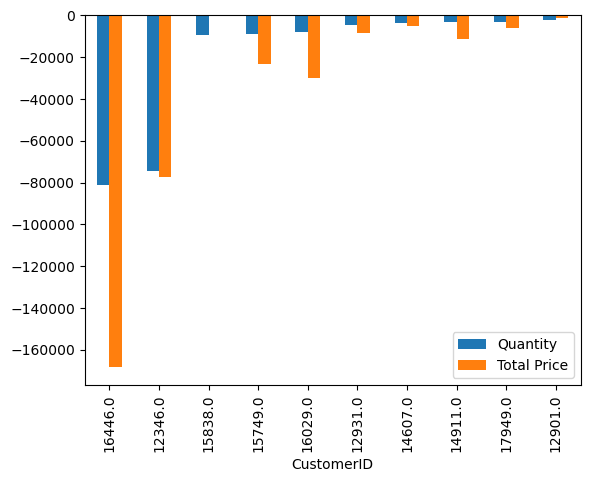

In [14]:
customer_cancelled.head(10).plot(kind='bar')

In [15]:
customer_regular_transaction = numeric_invoices.groupby('CustomerID')[['Quantity','Total Price']].sum().sort_values(by='Quantity',ascending = False)
customer_regular_transaction

,Quantity,Total Price
CustomerID,,
14646.0,197491,280206.02
16446.0,80997,168472.50
14911.0,80515,143825.06
12415.0,77670,124914.53
12346.0,74215,77183.60
...,...,...
17956.0,1,12.75
17846.0,1,2033.10
15823.0,1,15.00


# Top Customers by Quantity and Total Price:
### - Customer with ID 14646.0:

### - Quantity: 197,491
### - Total Price: 280,206.02

In [16]:
invoice_list =[]
numeric_values = tuple(numeric_invoices['InvoiceNo'].unique())
object_values = tuple(object_invoices['InvoiceNo'].unique())

for i, j in zip(numeric_values, object_values):
    invoice_list.append((i, j))

    
print("Combined values of invoice:")
print(tabulate(invoice_list, headers=['Numeric Invoice No.', 'Object Invoice No.'])) 

Combined values of invoice:
  Numeric Invoice No.  Object Invoice No.
---------------------  --------------------
               536365  C536379
               536366  C536383
               536367  C536391
               536368  C536506
               536369  C536543
               536370  C536548
               536371  C536606
               536372  C536622
               536373  C536625
               536374  C536642
               536375  C536734
               536376  C536737
               536377  C536757
               536378  C536758
               536380  C536760
               536381  C536807
               536382  C536812
               536384  C536814
               536385  C536815
               536386  C536816
               536387  C536817
               536388  C536818
               536389  C536820
               536390  C536822
               536392  C536825
               536393  C536826
               536394  C536827
               536395  C536828
               536

In [17]:
invoice_list_10 =[]
numeric_values = tuple(numeric_invoices['InvoiceNo'].unique())
object_values = tuple(object_invoices['InvoiceNo'].unique())

for i in range(0,10):
    invoice_list_10.append((numeric_values[i],object_values[i]))
    
print("Combined values of invoice:")
print()
print(tabulate(invoice_list_10, headers=['Regular Invoice No.', 'Cancelled Invoice No.'])) 

Combined values of invoice:

  Regular Invoice No.  Cancelled Invoice No.
---------------------  -----------------------
               536365  C536379
               536366  C536383
               536367  C536391
               536368  C536506
               536369  C536543
               536370  C536548
               536371  C536606
               536372  C536622
               536373  C536625
               536374  C536642


Total no. of cancelled order is 9291
Total no. of  regular transaction order is 532618


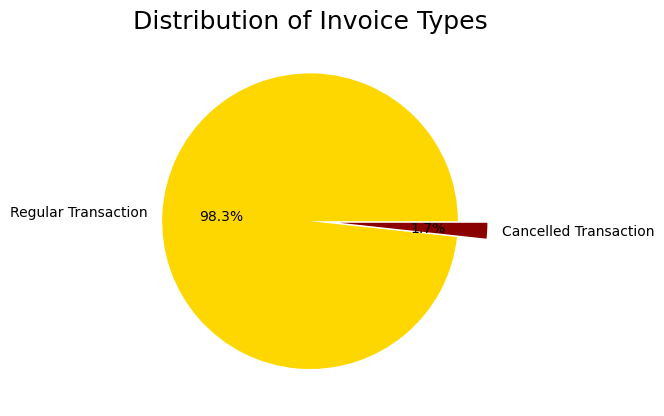

In [18]:
print('Total no. of cancelled order is', len(object_invoices))
print('Total no. of  regular transaction order is', len(numeric_invoices))


numeric_percentage = len(numeric_invoices) / len(df) * 100
object_percentage = len(object_invoices) / len(df) * 100

labels = ['Regular Transaction', 'Cancelled Transaction']
sizes = [numeric_percentage, object_percentage]
colors = [ 'gold', 'darkred']
explode = (0, 0.2) 
plt.pie(sizes, explode=explode, labels=labels, colors=colors,
        autopct='%1.1f%%', )


plt.title('Distribution of Invoice Types',fontsize=18)
plt.show()

# `Quantity` Feature: 

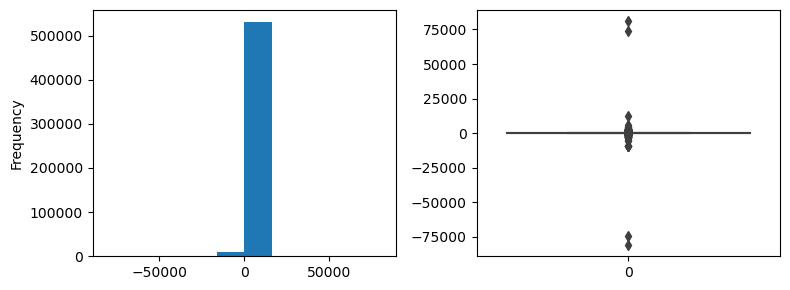

In [19]:
plt.figure(figsize=(8,3))
plt.subplot(1,2,1)
df.Quantity.plot(kind='hist')
plt.subplot(1,2,2)
sns.boxplot(df.Quantity)
plt.tight_layout()

## `Quantity` is -ve : It typically represents product returns, cancellations, or adjustments. 

In [20]:
Quantity_negative = df.Quantity[df.Quantity<0]

Text(0.5, 1.0, 'Distribution of Quantity')

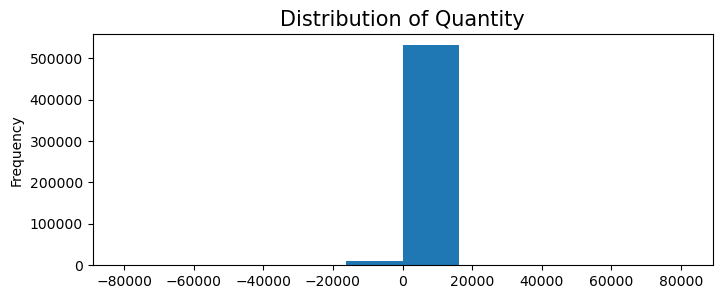

In [21]:
plt.figure(figsize=(8,3))
df.Quantity.plot(kind='hist')
plt.title('Distribution of Quantity',fontsize=15)

## Negative `Quantity` Distribution

Text(0.5, 1.0, '-90000 < Quantity <-10000')

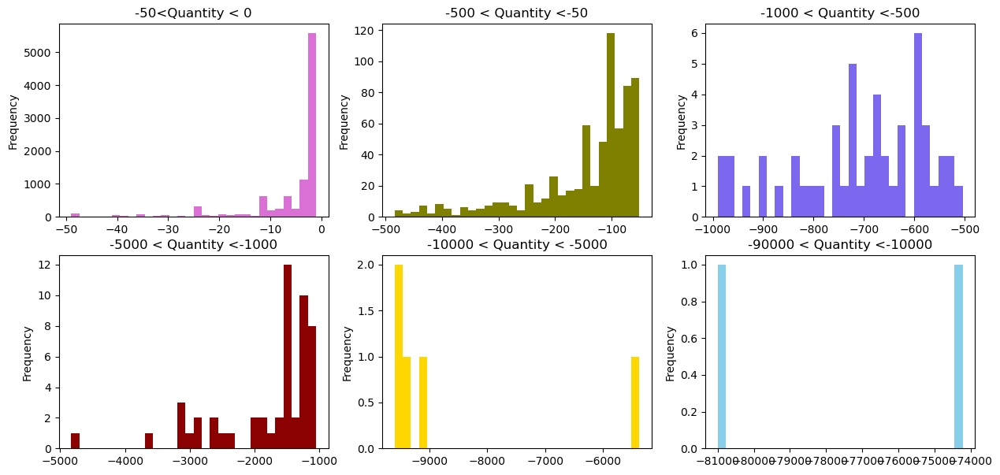

In [22]:
plt.figure(figsize=(15,7))
plt.subplot(2,3,1)
df[(df.Quantity>-50)&(df.Quantity<0)].Quantity.plot(kind='hist',bins=30, color ='orchid')
plt.title('-50<Quantity < 0')
plt.subplot(2,3,2)
df[(df.Quantity>-500) & ((df.Quantity<-50))].Quantity.plot(kind='hist',bins=30, color ='olive')
plt.title('-500 < Quantity <-50')
plt.subplot(2,3,3)
df[(df.Quantity>-1000) & ((df.Quantity<-500))].Quantity.plot(kind='hist',bins=30, color ='mediumslateblue')
plt.title('-1000 < Quantity <-500')
plt.subplot(2,3,4)
df[(df.Quantity>-5000) & ((df.Quantity<-1000))].Quantity.plot(kind='hist',bins=30, color ='darkred')
plt.title('-5000 < Quantity <-1000')
plt.subplot(2,3,5)
df[(df.Quantity>-10000) & ((df.Quantity<-5000))].Quantity.plot(kind='hist',bins=30, color ='gold')
plt.title('-10000 < Quantity < -5000')
plt.subplot(2,3,6)
df[(df.Quantity>-90000) & ((df.Quantity<-10000))].Quantity.plot(kind='hist',bins=30, color ='skyblue')
plt.title('-90000 < Quantity <-10000')

## Positive `Quantity` Distribution

Text(0.5, 1.0, ' Quantity > 10,000')

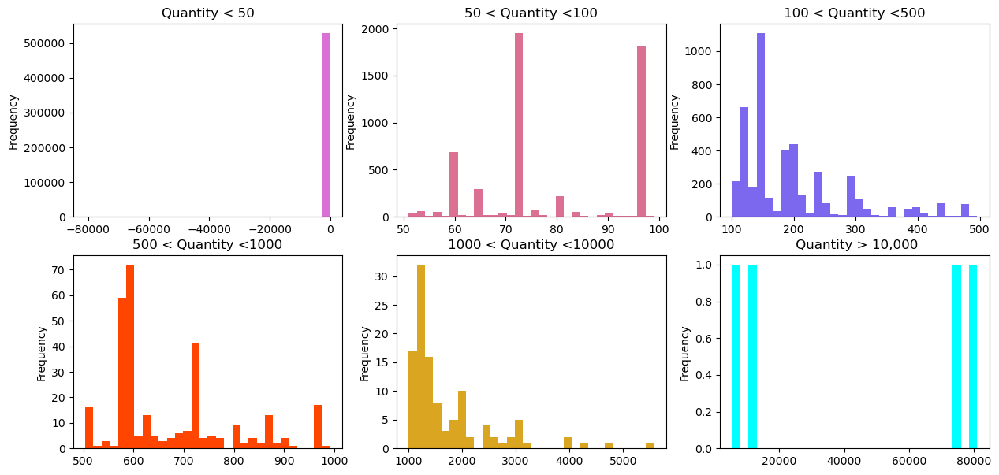

In [23]:
plt.figure(figsize=(15,7))
plt.subplot(2,3,1)
df[df.Quantity<50].Quantity.plot(kind='hist',bins=30, color ='orchid')
plt.title('Quantity < 50')
plt.subplot(2,3,2)
df[(df.Quantity>50) & ((df.Quantity<100))].Quantity.plot(kind='hist',bins=30, color ='palevioletred')
plt.title('50 < Quantity <100')
plt.subplot(2,3,3)
df[(df.Quantity>100) & ((df.Quantity<500))].Quantity.plot(kind='hist',bins=30, color ='mediumslateblue')
plt.title('100 < Quantity <500')
plt.subplot(2,3,4)
df[(df.Quantity>500) & ((df.Quantity<1000))].Quantity.plot(kind='hist',bins=30, color ='orangered')
plt.title('500 < Quantity <1000')
plt.subplot(2,3,5)
df[(df.Quantity>1000) & ((df.Quantity<10000))].Quantity.plot(kind='hist',bins=30, color ='goldenrod')
plt.title('1000 < Quantity <10000')
plt.subplot(2,3,6)
df[(df.Quantity>5000)  ].Quantity.plot(kind='hist',bins=30, color ='aqua')
plt.title(' Quantity > 10,000')


# Most significant Transaction

In [24]:
df[df.Quantity ==df.Quantity.max()]

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Total Price
540421,581483,23843,"PAPER CRAFT , LITTLE BIRDIE",80995,2011-12-09 09:15:00,2.08,16446.0,United Kingdom,168469.6


### -This specific row seems to represent a substantial transaction with the highest quantity recorded in the dataset. The item with StockCode 581483, described as "PAPER CRAFT, LITTLE BIRDIE," was purchased in a quantity of 80,995 units. The transaction occurred on December 9, 2011, at 09:15 AM with customerId= 16446. 
### - This exceptional transaction could indicate a bulk purchase or a special circumstance. 

In [25]:
df[df.CustomerID == 16446]

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Total Price
194354,553573,22980,PANTRY SCRUBBING BRUSH,1,2011-05-18 09:52:00,1.65,16446.0,United Kingdom,1.65
194355,553573,22982,PANTRY PASTRY BRUSH,1,2011-05-18 09:52:00,1.25,16446.0,United Kingdom,1.25
540421,581483,23843,"PAPER CRAFT , LITTLE BIRDIE",80995,2011-12-09 09:15:00,2.08,16446.0,United Kingdom,168469.60
540422,C581484,23843,"PAPER CRAFT , LITTLE BIRDIE",-80995,2011-12-09 09:27:00,2.08,16446.0,United Kingdom,-168469.60


<Axes: ylabel='Frequency'>

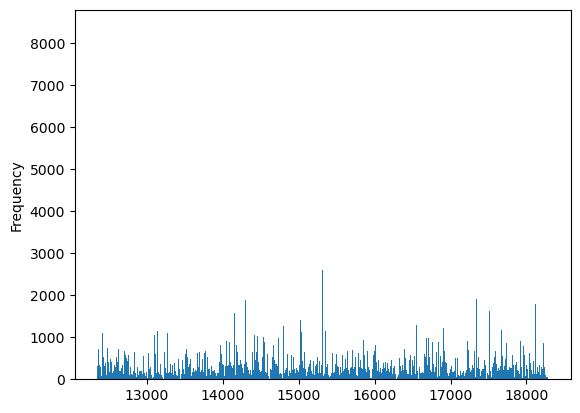

In [26]:
df.CustomerID.plot(kind='hist', bins=1000)

### - On December 9, 2011, the customer with ID 16446 made two transactions involving the item `PAPER CRAFT, LITTLE BIRDIE.` In the first transaction, they purchased 80,995 units at a unit price of 2.08, totaling 168,469.60 units of currency. Shortly after, in the second transaction, they returned the entire quantity, resulting in a negative total price of -168,469.60 units of currency. Both transactions occurred within minutes of each other.

# Most frequently purcahsed item

In [27]:
df.Description.describe()

count                                 540455
unique                                  4223
top       WHITE HANGING HEART T-LIGHT HOLDER
freq                                    2369
Name: Description, dtype: object

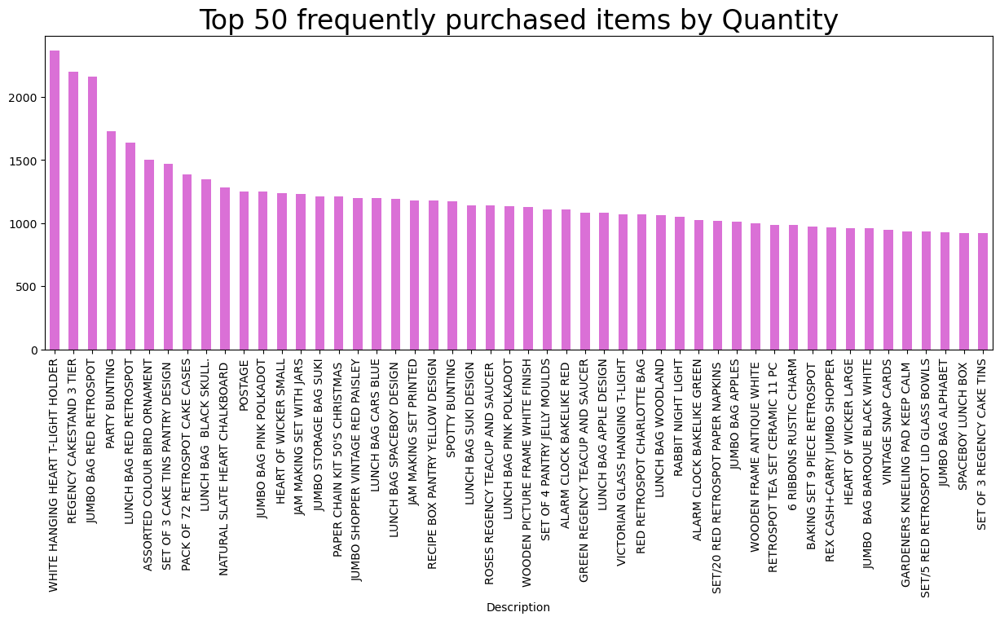

,Quantity
Description,
WORLD WAR 2 GLIDERS ASSTD DESIGNS,53847
JUMBO BAG RED RETROSPOT,47363
ASSORTED COLOUR BIRD ORNAMENT,36381
POPCORN HOLDER,36334
PACK OF 72 RETROSPOT CAKE CASES,36039
...,...
Damaged,-7540
Printing smudges/thrown away,-9058
check,-12030


In [28]:
frequently_purchased_items = df.groupby('Description')[['Quantity']].sum().sort_values(by = 'Quantity',ascending =False)

plt.figure(figsize=(15,5))
df.groupby('Description')['Quantity'].count().sort_values(ascending =False).head(50).plot(kind='bar', color ='orchid')
plt.title("Top 50 frequently purchased items by Quantity",fontsize=24)
plt.show()
frequently_purchased_items

# `StockCode` with Gift Coupon

In [29]:

gift_items = df[df['StockCode'].str.contains('gift', case=False, na=False)]
print('Total no.of Stockcode for gift coupon', len(gift_items))
gift_items.head()


Total no.of Stockcode for gift coupon 34


,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Total Price
38248,539492,gift_0001_40,Dotcomgiftshop Gift Voucher £40.00,1,2010-12-20 10:14:00,34.04,NaN,United Kingdom,34.04
42057,539958,gift_0001_50,Dotcomgiftshop Gift Voucher £50.00,1,2010-12-23 13:26:00,42.55,NaN,United Kingdom,42.55
44725,540238,gift_0001_30,Dotcomgiftshop Gift Voucher £30.00,1,2011-01-05 14:44:00,25.53,NaN,United Kingdom,25.53
44794,540238,gift_0001_20,Dotcomgiftshop Gift Voucher £20.00,1,2011-01-05 14:44:00,17.02,NaN,United Kingdom,17.02
55589,540995,gift_0001_20,Dotcomgiftshop Gift Voucher £20.00,1,2011-01-13 09:30:00,16.67,NaN,United Kingdom,16.67


# `StockCode` for post

In [30]:
post_items = df[df['StockCode'].str.contains('post', case=False, na=False)]
print('Total no.of Stockcode for post', len(post_items))
post_items.head(3)

Total no.of Stockcode for post 1256


,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Total Price
45,536370,POST,POSTAGE,3,2010-12-01 08:45:00,18.0,12583.0,France,54.0
386,536403,POST,POSTAGE,1,2010-12-01 11:27:00,15.0,12791.0,Netherlands,15.0
1123,536527,POST,POSTAGE,1,2010-12-01 13:04:00,18.0,12662.0,Germany,18.0


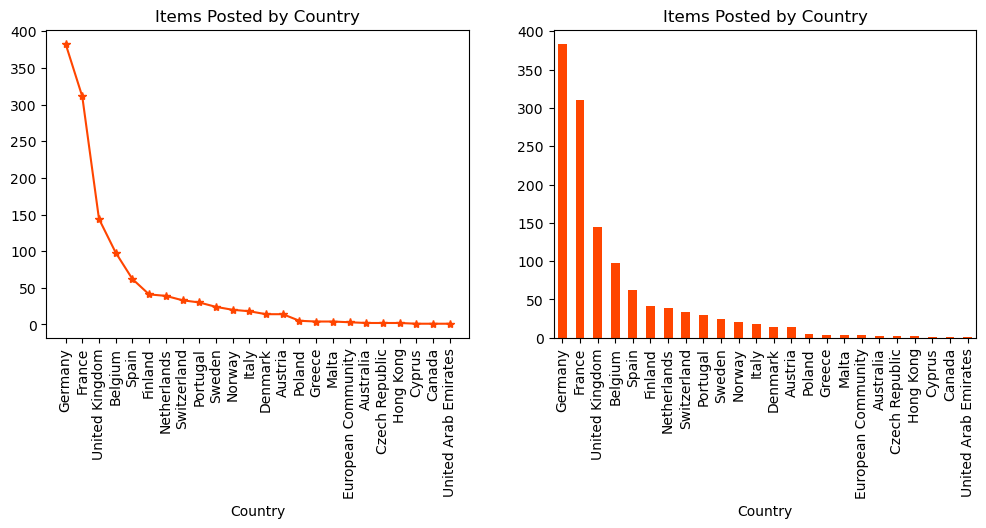

In [31]:
item_post_country = post_items.groupby('Country')['Quantity'].count().sort_values(ascending =False)
plt.figure(figsize =(12,4))
plt.subplot(121)
item_post_country.plot(color ='orangered', marker ='*')
xrange =range(len(item_post_country))
plt.xticks(xrange,item_post_country.index, rotation =90)
plt.title("Items Posted by Country")
plt.subplot(122)
item_post_country.plot(kind ='bar', color ='orangered')
plt.title("Items Posted by Country")
plt.show()

In [32]:
df[df['StockCode'].str.contains('DOT', case=False, na=False)]

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Total Price
1814,536544,DOT,DOTCOM POSTAGE,1,2010-12-01 14:32:00,569.77,NaN,United Kingdom,569.77
3041,536592,DOT,DOTCOM POSTAGE,1,2010-12-01 17:06:00,607.49,NaN,United Kingdom,607.49
5450,536862,DOT,DOTCOM POSTAGE,1,2010-12-03 11:13:00,254.43,NaN,United Kingdom,254.43
5545,536864,DOT,DOTCOM POSTAGE,1,2010-12-03 11:27:00,121.06,NaN,United Kingdom,121.06
5685,536865,DOT,DOTCOM POSTAGE,1,2010-12-03 11:28:00,498.47,NaN,United Kingdom,498.47
...,...,...,...,...,...,...,...,...,...
536834,581219,DOT,DOTCOM POSTAGE,1,2011-12-08 09:28:00,1008.96,NaN,United Kingdom,1008.96
537254,581238,DOT,DOTCOM POSTAGE,1,2011-12-08 10:53:00,1683.75,NaN,United Kingdom,1683.75
539368,581439,DOT,DOTCOM POSTAGE,1,2011-12-08 16:30:00,938.59,NaN,United Kingdom,938.59
540908,581492,DOT,DOTCOM POSTAGE,1,2011-12-09 10:03:00,933.17,NaN,United Kingdom,933.17


# The description of the customer's transaction

### The description of the customer who spent the most

In [33]:
df[df['Total Price']  == df['Total Price'].max()]

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Total Price
540421,581483,23843,"PAPER CRAFT , LITTLE BIRDIE",80995,2011-12-09 09:15:00,2.08,16446.0,United Kingdom,168469.6


In [34]:
df[df['Total Price']  == df['Total Price'].min()]

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Total Price
540422,C581484,23843,"PAPER CRAFT , LITTLE BIRDIE",-80995,2011-12-09 09:27:00,2.08,16446.0,United Kingdom,-168469.6


In [35]:
df[df['Total Price'] < 0]

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Total Price
141,C536379,D,Discount,-1,2010-12-01 09:41:00,27.50,14527.0,United Kingdom,-27.50
154,C536383,35004C,SET OF 3 COLOURED FLYING DUCKS,-1,2010-12-01 09:49:00,4.65,15311.0,United Kingdom,-4.65
235,C536391,22556,PLASTERS IN TIN CIRCUS PARADE,-12,2010-12-01 10:24:00,1.65,17548.0,United Kingdom,-19.80
236,C536391,21984,PACK OF 12 PINK PAISLEY TISSUES,-24,2010-12-01 10:24:00,0.29,17548.0,United Kingdom,-6.96
237,C536391,21983,PACK OF 12 BLUE PAISLEY TISSUES,-24,2010-12-01 10:24:00,0.29,17548.0,United Kingdom,-6.96
...,...,...,...,...,...,...,...,...,...
540449,C581490,23144,ZINC T-LIGHT HOLDER STARS SMALL,-11,2011-12-09 09:57:00,0.83,14397.0,United Kingdom,-9.13
541541,C581499,M,Manual,-1,2011-12-09 10:28:00,224.69,15498.0,United Kingdom,-224.69
541715,C581568,21258,VICTORIAN SEWING BOX LARGE,-5,2011-12-09 11:57:00,10.95,15311.0,United Kingdom,-54.75
541716,C581569,84978,HANGING HEART JAR T-LIGHT HOLDER,-1,2011-12-09 11:58:00,1.25,17315.0,United Kingdom,-1.25


In [36]:
customersID_transaction = df.groupby('CustomerID')['Total Price'].sum().sort_values(ascending=False)
customersID_Invoice = df.groupby('CustomerID')['InvoiceNo'].count().sort_values(ascending=False)
Invoice_transaction = df.groupby('InvoiceNo')['Total Price'].count().sort_values(ascending=False)
Invoice_transaction.head(10).index

Index([573585, 581219, 581492, 580729, 558475, 579777, 581217, 537434, 580730,
       538071],
      dtype='object', name='InvoiceNo')

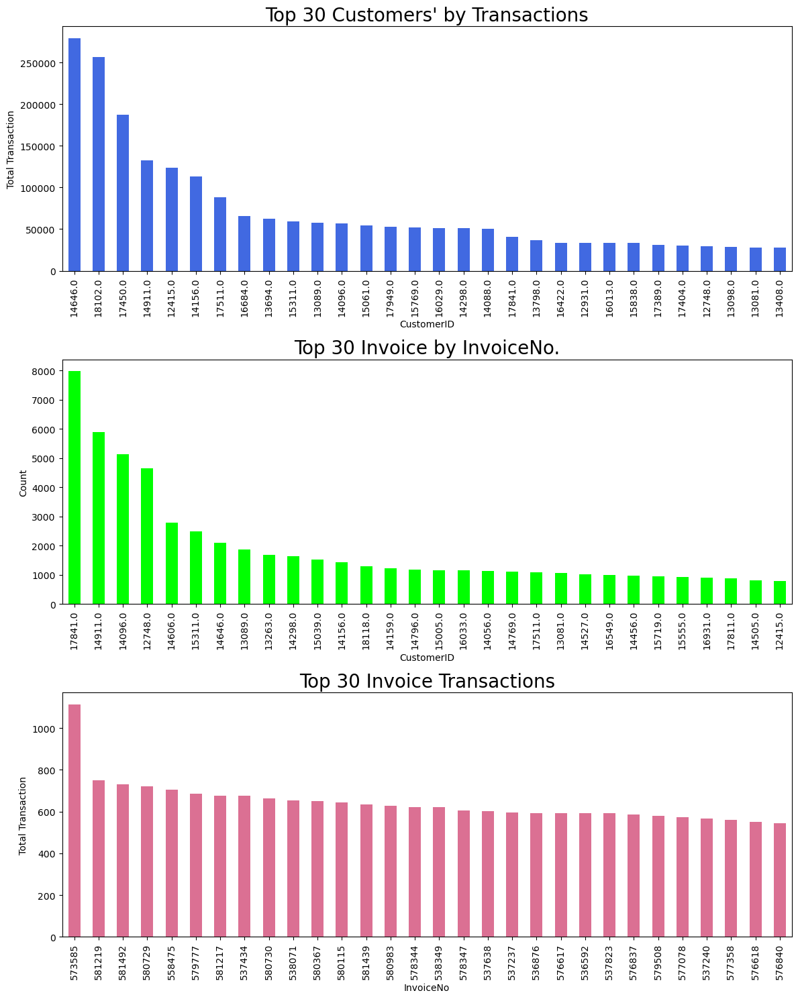

In [37]:
fig, axs = plt.subplots(3, 1, figsize=(12, 15))
customersID_transaction.head(30).plot(kind='bar', color ='royalblue' , ax=axs[0])
axs[0].set_title("Top 30 Customers' by Transactions", fontsize=20)
axs[0].set_xlabel("CustomerID")
axs[0].set_ylabel("Total Transaction")

customersID_Invoice.head(30).plot(kind='bar', color ='lime',ax=axs[1] )
axs[1].set_title("Top 30 Invoice by InvoiceNo.", fontsize=20)
axs[1].set_xlabel("CustomerID")
axs[1].set_ylabel("Count")


Invoice_transaction.head(30).plot(kind='bar', color ='palevioletred',ax=axs[2] )
axs[2].set_title("Top 30 Invoice Transactions", fontsize=20)
axs[2].set_xlabel("InvoiceNo")
axs[2].set_ylabel("Total Transaction")
plt.tight_layout()
plt.show()

# 

In [38]:
for invoice in Invoice_transaction.head(30).index:
    print(invoice, ':', df[df.InvoiceNo == invoice]['CustomerID'].unique()) #573585, 581219

573585 : [nan]
581219 : [nan]
581492 : [nan]
580729 : [nan]
558475 : [nan]
579777 : [nan]
581217 : [nan]
537434 : [nan]
580730 : [nan]
538071 : [nan]
580367 : [nan]
580115 : [nan]
581439 : [nan]
580983 : [nan]
578344 : [nan]
538349 : [nan]
578347 : [nan]
537638 : [nan]
537237 : [nan]
536876 : [nan]
576617 : [nan]
536592 : [nan]
537823 : [nan]
576837 : [nan]
579508 : [nan]
577078 : [nan]
537240 : [nan]
577358 : [nan]
576618 : [nan]
576840 : [nan]


# Valid Customer (with valid CustomerID and +ve Transaction )

In [39]:
valid_customerID = df[(df['CustomerID'].notna())  & (df['Total Price']>0)]
Total_valid_custmoer = len(valid_customerID)
print('Total No. of Valid customers : ', Total_valid_custmoer)

Total No. of Valid customers :  397884


Text(0.5, 1.0, 'Top 30 Invoice Transactions with valid CustomerID')

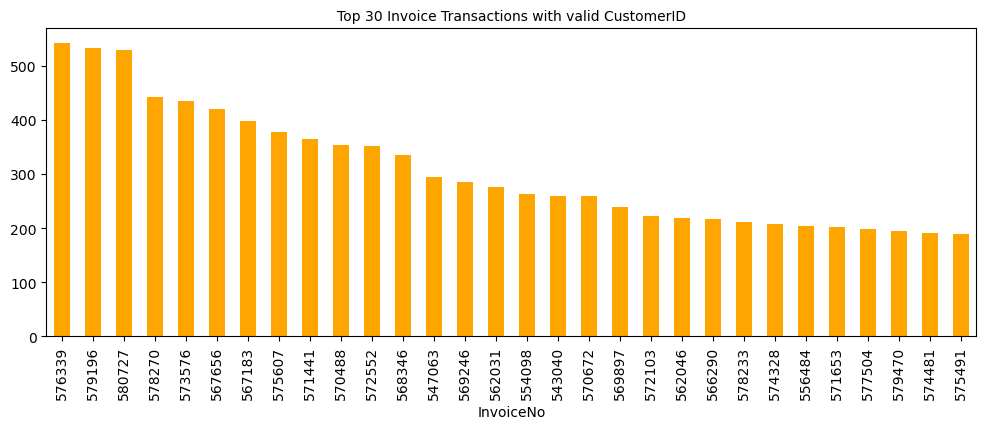

In [40]:
valid_Invoice_transaction = valid_customerID.groupby('InvoiceNo')['Total Price'].count().sort_values(ascending=False)
#df.dropna(subset=['CustomerID']).groupby('InvoiceNo')['Total Price'].count().sort_values(ascending=False)
plt.figure(figsize=(12,4))
valid_Invoice_transaction.head(30).plot(kind='bar', color='orange')
plt.title("Top 30 Invoice Transactions with valid CustomerID", fontsize=10)

In [41]:
df[df.UnitPrice == df.UnitPrice.max()][["Description",'CustomerID', 'InvoiceNo','UnitPrice','Quantity']]

,Description,CustomerID,InvoiceNo,UnitPrice,Quantity
222681,Manual,15098.0,C556445,38970.0,-1


In [42]:
df[df.UnitPrice == df.UnitPrice.min()][["Description",'CustomerID', 'InvoiceNo','UnitPrice','Quantity']]

,Description,CustomerID,InvoiceNo,UnitPrice,Quantity
299983,Adjust bad debt,NaN,A563186,-11062.06,1
299984,Adjust bad debt,NaN,A563187,-11062.06,1


In [43]:
df[(df.UnitPrice >0)][["Description",'CustomerID', 'InvoiceNo','UnitPrice','Quantity']].sort_values(by='UnitPrice')

,Description,CustomerID,InvoiceNo,UnitPrice,Quantity
157195,PADS TO MATCH ALL CUSHIONS,13952.0,550193,0.001,1
279045,PADS TO MATCH ALL CUSHIONS,15618.0,561226,0.001,1
361741,Bank Charges,13405.0,568375,0.001,1
359871,PADS TO MATCH ALL CUSHIONS,16198.0,568200,0.001,1
108088,Discount,16422.0,C545478,0.010,-720
...,...,...,...,...,...
15016,AMAZON FEE,NaN,C537630,13541.330,-1
43703,AMAZON FEE,NaN,C540118,16453.710,-1
43702,AMAZON FEE,NaN,C540117,16888.020,-1
524602,AMAZON FEE,NaN,C580605,17836.460,-1


# Item that generates the highest revenue.

In [44]:
df[['Description','Quantity','Total Price','InvoiceNo','CustomerID','Country']].sort_values(by='Total Price', ascending =False)

,Description,Quantity,Total Price,InvoiceNo,CustomerID,Country
540421,"PAPER CRAFT , LITTLE BIRDIE",80995,168469.60,581483,16446.0,United Kingdom
61619,MEDIUM CERAMIC TOP STORAGE JAR,74215,77183.60,541431,12346.0,United Kingdom
222680,PICNIC BASKET WICKER 60 PIECES,60,38970.00,556444,15098.0,United Kingdom
15017,AMAZON FEE,1,13541.33,537632,NaN,United Kingdom
299982,Adjust bad debt,1,11062.06,A563185,NaN,United Kingdom
...,...,...,...,...,...,...
43702,AMAZON FEE,-1,-16888.02,C540117,NaN,United Kingdom
524602,AMAZON FEE,-1,-17836.46,C580605,NaN,United Kingdom
222681,Manual,-1,-38970.00,C556445,15098.0,United Kingdom
61624,MEDIUM CERAMIC TOP STORAGE JAR,-74215,-77183.60,C541433,12346.0,United Kingdom


In [45]:
df[df['Description'] == 'WHITE HANGING HEART T-LIGHT HOLDER']

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Total Price
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom,15.30
49,536373,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 09:02:00,2.55,17850.0,United Kingdom,15.30
66,536375,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 09:32:00,2.55,17850.0,United Kingdom,15.30
220,536390,85123A,WHITE HANGING HEART T-LIGHT HOLDER,64,2010-12-01 10:19:00,2.55,17511.0,United Kingdom,163.20
262,536394,85123A,WHITE HANGING HEART T-LIGHT HOLDER,32,2010-12-01 10:39:00,2.55,13408.0,United Kingdom,81.60
...,...,...,...,...,...,...,...,...,...
537291,581246,85123A,WHITE HANGING HEART T-LIGHT HOLDER,1,2011-12-08 10:59:00,2.95,15453.0,United Kingdom,2.95
537326,581253,85123A,WHITE HANGING HEART T-LIGHT HOLDER,2,2011-12-08 11:15:00,2.95,16891.0,United Kingdom,5.90
537852,581356,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2011-12-08 12:28:00,2.95,17830.0,United Kingdom,17.70
539979,581452,85123A,WHITE HANGING HEART T-LIGHT HOLDER,32,2011-12-08 18:03:00,2.55,17675.0,United Kingdom,81.60


In [46]:
Description_transaction = df.groupby(['Description'])[['Total Price','InvoiceNo','CustomerID']]
Description_transaction.count().sort_values(by='Total Price',ascending=False).head()

,Total Price,InvoiceNo,CustomerID
Description,,,
WHITE HANGING HEART T-LIGHT HOLDER,2369,2369,2070
REGENCY CAKESTAND 3 TIER,2200,2200,1905
JUMBO BAG RED RETROSPOT,2159,2159,1662
PARTY BUNTING,1727,1727,1416
LUNCH BAG RED RETROSPOT,1638,1638,1358


In [47]:
# Description_transaction = df.groupby(['Description','Total Price'])[['Total Price','InvoiceNo','CustomerID']].count()
# Description_transaction.sort_values(by='InvoiceNo', ascending ='False').head()

# Frequently sold items by total amount

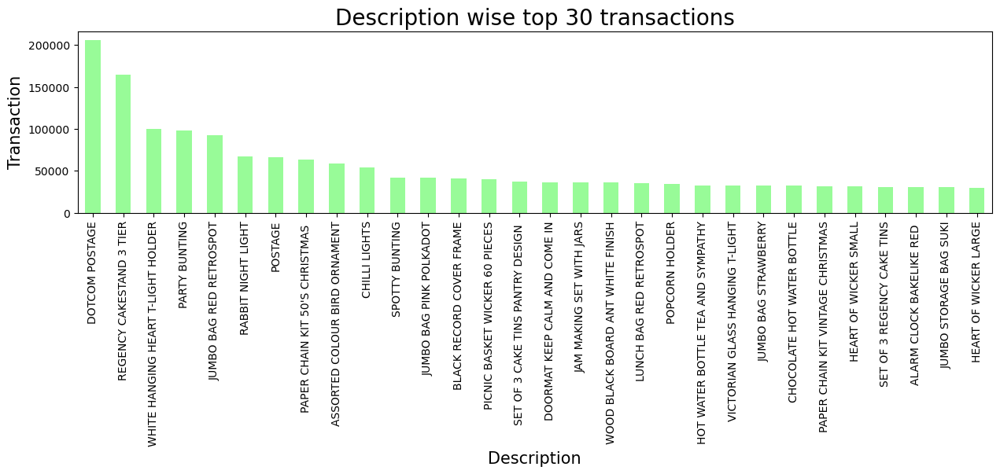

In [48]:
Description_transaction30 = df.groupby('Description')['Total Price'].sum().sort_values(ascending = False).head(30)
plt.figure(figsize=(15, 3))
Description_transaction30.plot(kind='bar', color='palegreen')
plt.title("Description wise top 30 transactions", fontsize =20)
plt.xlabel('Description', fontsize =15)
plt.ylabel('Transaction', fontsize =15)
plt.xticks(rotation=90 )
plt.show()

# Customer  Information

In [49]:
unique_CustomerID = df.CustomerID.unique().tolist()
unique_InvoiceNo = (df.InvoiceNo.unique().tolist())

No_of_unique_invoice =len(unique_InvoiceNo)
No_of_coustomerId=len(unique_CustomerID)
print('No. of unique Invoice No.',No_of_unique_invoice,'\nNo. of unique coustomerId', No_of_coustomerId)

No. of unique Invoice No. 25900 
No. of unique coustomerId 4373


In [50]:
df.groupby('Description')[['CustomerID']].count().sort_values(by='CustomerID',ascending =False)

,CustomerID
Description,
WHITE HANGING HEART T-LIGHT HOLDER,2070
REGENCY CAKESTAND 3 TIER,1905
JUMBO BAG RED RETROSPOT,1662
ASSORTED COLOUR BIRD ORNAMENT,1418
PARTY BUNTING,1416
...,...
Printing smudges/thrown away,0
PURPLE VINTAGE EARRINGS,0
PURPLE LEAVES AND BEADS PHONE CHAR,0


In [51]:
df.groupby('Description')[['Total Price','CustomerID']].max()

,Total Price,CustomerID
Description,,
20713,0.0,NaN
4 PURPLE FLOCK DINNER CANDLES,30.6,18126.0
50'S CHRISTMAS GIFT BAG LARGE,416.0,18223.0
DOLLY GIRL BEAKER,432.0,18249.0
I LOVE LONDON MINI BACKPACK,187.5,18096.0
...,...,...
wrongly marked carton 22804,0.0,NaN
wrongly marked. 23343 in box,0.0,NaN
wrongly sold (22719) barcode,0.0,NaN


In [52]:
df.groupby('Description')[['Total Price','CustomerID']].count().sort_values(by='CustomerID', ascending = False)

,Total Price,CustomerID
Description,,
WHITE HANGING HEART T-LIGHT HOLDER,2369,2070
REGENCY CAKESTAND 3 TIER,2200,1905
JUMBO BAG RED RETROSPOT,2159,1662
ASSORTED COLOUR BIRD ORNAMENT,1501,1418
PARTY BUNTING,1727,1416
...,...,...
Printing smudges/thrown away,1,0
PURPLE VINTAGE EARRINGS,3,0
PURPLE LEAVES AND BEADS PHONE CHAR,2,0


In [53]:
df_product = df[["Description","StockCode"]].groupby("Description").count()  #agg({"StockCode":"count"}).reset_index()
df_product.sort_values("StockCode", ascending=False)

,StockCode
Description,
WHITE HANGING HEART T-LIGHT HOLDER,2369
REGENCY CAKESTAND 3 TIER,2200
JUMBO BAG RED RETROSPOT,2159
PARTY BUNTING,1727
LUNCH BAG RED RETROSPOT,1638
...,...
ORANGE FELT VASE + FLOWERS,1
OPULENT VELVET SET/3 CANDLES,1
OOPS ! adjustment,1



### A "StockCode" is a unique identifier used to represent a specific product or item in a retail or inventory management system.

In [54]:
df[df.Description =='OOPS ! adjustment'][['Quantity','InvoiceNo','UnitPrice']]

,Quantity,InvoiceNo,UnitPrice
345011,-384,567132,0.0


# Invoice Date

In [55]:
df['Year'] = df.InvoiceDate.dt.year
df['Month'] = df.InvoiceDate.dt.month
df['Day'] = df.InvoiceDate.dt.day_name()
df.groupby('Year')[['Total Price', 'Quantity']].sum()

,Total Price,Quantity
Year,,
2010,748957.020,342228
2011,8998790.914,4834222


In [56]:
df.groupby('Year')[['Quantity']].max()

,Quantity
Year,
2010,2880
2011,80995


## Overall, the data provides a snapshot of the total sales or revenue generated for each year based on the "Total Price" of transactions. 

- $Revenue _{ 2010} < Revenue_{ 2011}$

<Figure size 1500x300 with 0 Axes>

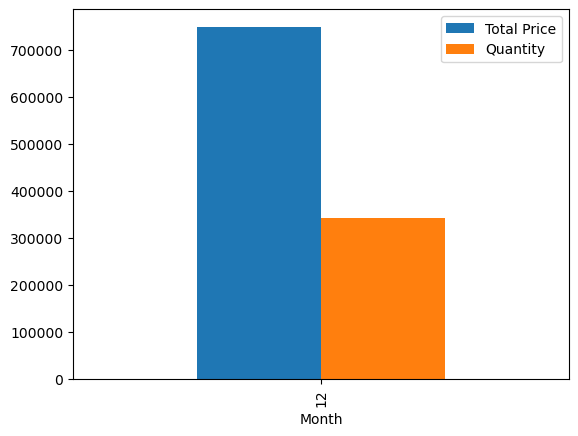

In [57]:
plt.figure(figsize=(15,3))
#month_order = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
df[df.Year==2010].groupby('Month')[['Total Price', 'Quantity']].sum().plot(kind='bar')
plt.show()

### In year  2010, the entire revenue is collected in December only.

<Figure size 1500x300 with 0 Axes>

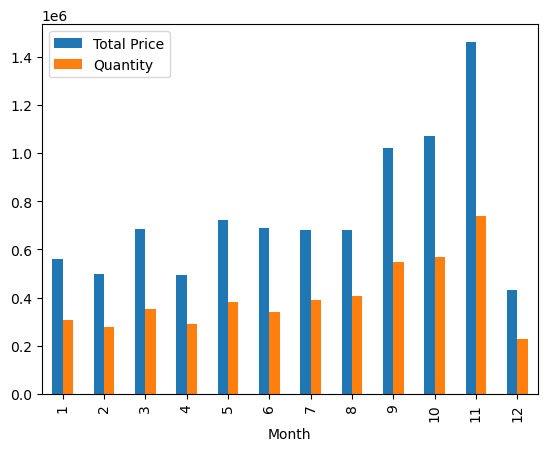

In [58]:
plt.figure(figsize=(15,3))
#month_order = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
df[df.Year==2011].groupby('Month')[['Total Price', 'Quantity']].sum().plot(kind='bar')
plt.show()

### In year  2011, the highest  revenue  is collected in November only.

<Figure size 1500x300 with 0 Axes>

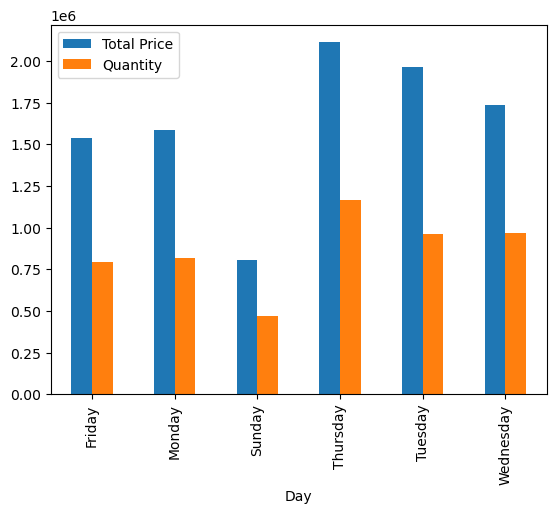

In [59]:
plt.figure(figsize=(15,3))
df.groupby('Day')[['Total Price', 'Quantity']].sum().plot(kind='bar')
plt.show()

### Most of the purchase happens on Thursday.

In [60]:
len(df.columns)
for col in df.columns:
    
    df[col].astype('str')

In [61]:
!pip install apyori

# Country-wise Transaction

In [62]:
country_groupby =df.groupby('Country')[['Quantity','Total Price']].sum()
country_revenue = country_groupby.sort_values(by='Total Price', ascending = False)
country_revenue.head()

,Quantity,Total Price
Country,,
United Kingdom,4263829,8187806.364
Netherlands,200128,284661.540
EIRE,142637,263276.820
Germany,117448,221698.210
France,110480,197403.900


In [63]:
country_revenue.tail()

,Quantity,Total Price
Country,,
Brazil,356,1143.60
RSA,352,1002.31
Czech Republic,592,707.72
Bahrain,260,548.40
Saudi Arabia,75,131.17


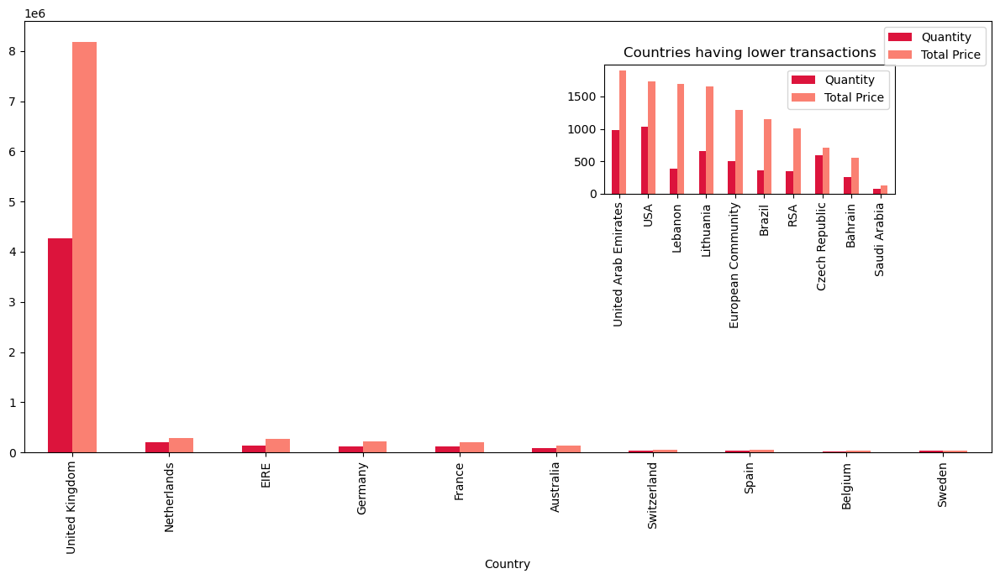

In [64]:
fig, ax1 = plt.subplots(figsize=(12, 7))
ax2 = ax1.inset_axes([0.6, 0.6, 0.3, 0.3])  # [x, y, width, height]
#======== Main Plot ==========
country_revenue.head(10).plot(kind='bar', color=['crimson', 'salmon'], ax=ax1)
##======== Inset Plot ==========
country_revenue.tail(10).plot(kind='bar', ax=ax2, color=['crimson', 'salmon'])
ax2.set_xlabel('') 
ax2.set_title('Countries having lower transactions')
#=============================
plt.tight_layout()
plt.show()

In [65]:
country_most_purchased = country_groupby.sort_values(by='Quantity', ascending = False)
country_most_purchased.head()

,Quantity,Total Price
Country,,
United Kingdom,4263829,8187806.364
Netherlands,200128,284661.540
EIRE,142637,263276.820
Germany,117448,221698.210
France,110480,197403.900


In [66]:
country_most_purchased.tail()

,Quantity,Total Price
Country,,
Lebanon,386,1693.88
Brazil,356,1143.60
RSA,352,1002.31
Bahrain,260,548.40
Saudi Arabia,75,131.17


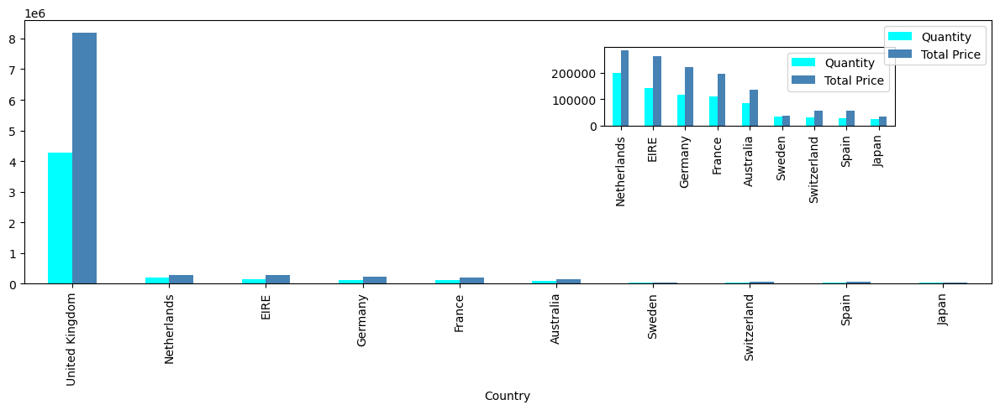

In [67]:
fig, ax1 = plt.subplots(figsize=(12, 5))
ax2 = ax1.inset_axes([0.6, 0.6, 0.3, 0.3])  # [x, y, width, height]
#======== Main Plot ==========
country_most_purchased.iloc[:10,:].plot(kind='bar', color=['aqua', 'steelblue'], ax=ax1)
##======== Inset Plot ==========
country_most_purchased.iloc[1:10,:].plot(kind='bar', ax=ax2, color=['aqua', 'steelblue'])
ax2.set_xlabel('') 
#ax2.get_legend().remove()
#=============================
plt.tight_layout()
plt.show()

In [68]:
UK_data = df[df['Country'] =="United Kingdom"].groupby(['InvoiceNo', 'Description'])[['Quantity','Total Price']].sum()
UK_data

Quantity  Total Price
InvoiceNo Description                                               
536365    CREAM CUPID HEARTS COAT HANGER              8        22.00
          GLASS STAR FROSTED T-LIGHT HOLDER           6        25.50
          KNITTED UNION FLAG HOT WATER BOTTLE         6        20.34
          RED WOOLLY HOTTIE WHITE HEART.              6        20.34
          SET 7 BABUSHKA NESTING BOXES                2        15.30
...                                                 ...          ...
C581490   ZINC T-LIGHT HOLDER STARS SMALL           -11        -9.13
C581499   Manual                                     -1      -224.69
C581568   VICTORIAN SEWING BOX LARGE                 -5       -54.75
C581569   36 PENCILS TUBE RED RETROSPOT              -5        -6.25
          HANGING HEART JAR T-LIGHT HOLDER           -1        -1.25

[483378 rows x 2 columns]

In [69]:
UK_revenue = UK_data.sort_values(by='Total Price', ascending = False)
UK_revenue

,,Quantity,Total Price
InvoiceNo,Description,,
581483,"PAPER CRAFT , LITTLE BIRDIE",80995,168469.60
541431,MEDIUM CERAMIC TOP STORAGE JAR,74215,77183.60
556444,PICNIC BASKET WICKER 60 PIECES,60,38970.00
537632,AMAZON FEE,1,13541.33
A563185,Adjust bad debt,1,11062.06
...,...,...,...
C540117,AMAZON FEE,-1,-16888.02
C580605,AMAZON FEE,-1,-17836.46
C556445,Manual,-1,-38970.00


In [70]:
UK_item_demand = UK_data.sort_values(by='Quantity', ascending = False)
UK_item_demand

,,Quantity,Total Price
InvoiceNo,Description,,
581483,"PAPER CRAFT , LITTLE BIRDIE",80995,168469.6
541431,MEDIUM CERAMIC TOP STORAGE JAR,74215,77183.6
578841,ASSTD DESIGN 3D PAPER STICKERS,12540,0.0
573008,WORLD WAR 2 GLIDERS ASSTD DESIGNS,4800,1008.0
554868,SMALL POPCORN HOLDER,4300,3096.0
...,...,...,...
C536757,ROTATING SILVER ANGELS T-LIGHT HLDR,-9360,-280.8
556690,printing smudges/thrown away,-9600,0.0
556691,printing smudges/thrown away,-9600,0.0


<Axes: xlabel='InvoiceNo,Description'>

<Figure size 1500x500 with 0 Axes>

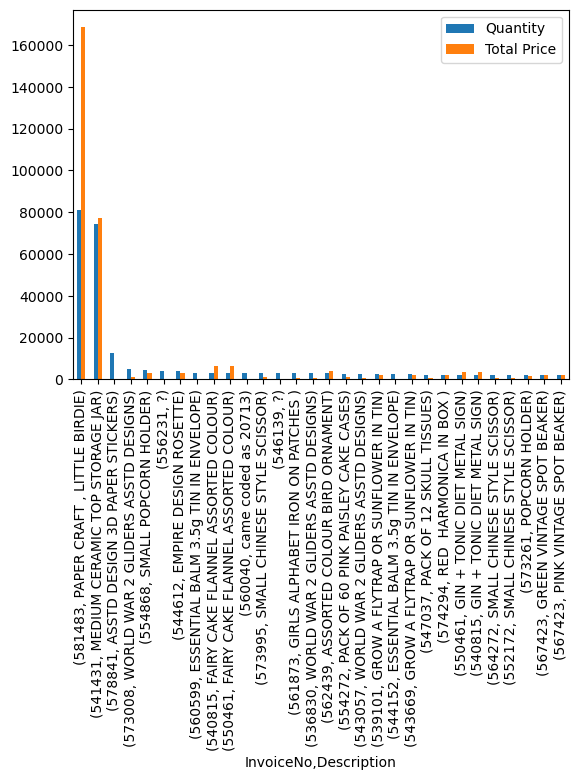

In [71]:
plt.figure(figsize=(15,5))
UK_item_demand.head(30).plot(kind='bar')

# Apriori Model Building

In [72]:
from apyori import apriori

In [73]:
InvoiceNo= df.groupby('InvoiceNo')['Description'].apply(list)
transactions =[]

for item in InvoiceNo:
    transactions.append(list(map(str, item)))

rules = apriori(transactions, min_support=0.01, min_confidence=0.2, 
               min_lift=2, min_length=2)
results = list(rules)
results

[RelationRecord(items=frozenset({"PAPER CHAIN KIT 50'S CHRISTMAS ", '60 CAKE CASES VINTAGE CHRISTMAS'}), support=0.01054054054054054, ordered_statistics=[OrderedStatistic(items_base=frozenset({'60 CAKE CASES VINTAGE CHRISTMAS'}), items_add=frozenset({"PAPER CHAIN KIT 50'S CHRISTMAS "}), confidence=0.43890675241157556, lift=9.715969989281886), OrderedStatistic(items_base=frozenset({"PAPER CHAIN KIT 50'S CHRISTMAS "}), items_add=frozenset({'60 CAKE CASES VINTAGE CHRISTMAS'}), confidence=0.23333333333333334, lift=9.715969989281886)]),
 RelationRecord(items=frozenset({'60 CAKE CASES VINTAGE CHRISTMAS', 'SET OF 20 VINTAGE CHRISTMAS NAPKINS'}), support=0.01054054054054054, ordered_statistics=[OrderedStatistic(items_base=frozenset({'60 CAKE CASES VINTAGE CHRISTMAS'}), items_add=frozenset({'SET OF 20 VINTAGE CHRISTMAS NAPKINS'}), confidence=0.43890675241157556, lift=18.42412461500779), OrderedStatistic(items_base=frozenset({'SET OF 20 VINTAGE CHRISTMAS NAPKINS'}), items_add=frozenset({'60 CAKE

In [74]:
results[0]

RelationRecord(items=frozenset({"PAPER CHAIN KIT 50'S CHRISTMAS ", '60 CAKE CASES VINTAGE CHRISTMAS'}), support=0.01054054054054054, ordered_statistics=[OrderedStatistic(items_base=frozenset({'60 CAKE CASES VINTAGE CHRISTMAS'}), items_add=frozenset({"PAPER CHAIN KIT 50'S CHRISTMAS "}), confidence=0.43890675241157556, lift=9.715969989281886), OrderedStatistic(items_base=frozenset({"PAPER CHAIN KIT 50'S CHRISTMAS "}), items_add=frozenset({'60 CAKE CASES VINTAGE CHRISTMAS'}), confidence=0.23333333333333334, lift=9.715969989281886)])

In [75]:
type(results[0])

apyori.RelationRecord

In [76]:
for i in results[0]:
    
    print('*', i)

* frozenset({"PAPER CHAIN KIT 50'S CHRISTMAS ", '60 CAKE CASES VINTAGE CHRISTMAS'})
* 0.01054054054054054
* [OrderedStatistic(items_base=frozenset({'60 CAKE CASES VINTAGE CHRISTMAS'}), items_add=frozenset({"PAPER CHAIN KIT 50'S CHRISTMAS "}), confidence=0.43890675241157556, lift=9.715969989281886), OrderedStatistic(items_base=frozenset({"PAPER CHAIN KIT 50'S CHRISTMAS "}), items_add=frozenset({'60 CAKE CASES VINTAGE CHRISTMAS'}), confidence=0.23333333333333334, lift=9.715969989281886)]


In [77]:
result02=results[0][2]
for i in result02[0]:
    print('*', i)

* frozenset({'60 CAKE CASES VINTAGE CHRISTMAS'})
* frozenset({"PAPER CHAIN KIT 50'S CHRISTMAS "})
* 0.43890675241157556
* 9.715969989281886


In [78]:
lift=[]
confidence =[]
support =[]
rule =[]
for item in results:
    rule.append(item[0])
    support.append(item[1])
    confidence.append(item[2][0][2])
    lift.append(item[2][0][3])
association_df = pd.DataFrame({'Support':support, 'Confidence':confidence, 'Lift':lift, 'Rule':rule})

association_df.sort_values(by='Lift', ascending= False)

,Support,Confidence,Lift,Rule
337,0.010888,0.730570,60.260387,"(REGENCY TEA PLATE GREEN , REGENCY TEA PLATE P..."
339,0.010502,0.866242,49.093367,"(REGENCY TEA PLATE PINK, REGENCY TEA PLATE ROS..."
323,0.010116,0.615023,48.270024,"(POPPY'S PLAYHOUSE BEDROOM , POPPY'S PLAYHOUSE..."
338,0.012432,0.834197,47.277242,"(REGENCY TEA PLATE GREEN , REGENCY TEA PLATE R..."
324,0.010154,0.597727,46.912534,"(POPPY'S PLAYHOUSE KITCHEN, POPPY'S PLAYHOUSE ..."
...,...,...,...,...
19,0.012471,0.220177,2.477233,"(WHITE HANGING HEART T-LIGHT HOLDER, ASSORTED ..."
195,0.017452,0.211710,2.381963,"(WHITE HANGING HEART T-LIGHT HOLDER, JUMBO BAG..."
286,0.012819,0.206596,2.324431,"(LUNCH BAG RED RETROSPOT, WHITE HANGING HEART ..."
241,0.010232,0.204633,2.302346,"(WHITE HANGING HEART T-LIGHT HOLDER, LUNCH BAG..."


In [79]:
association_df['Length'] = association_df['Rule'].apply(lambda x: len(x))

association_df['Support'] = association_df['Support'].round(2)
association_df['Confidence'] = association_df['Confidence'].round(2)
association_df['Lift'] = association_df['Lift'].round(2)
association_df.sort_values(by='Lift', ascending= False).head()

,Support,Confidence,Lift,Rule,Length
337,0.01,0.73,60.26,"(REGENCY TEA PLATE GREEN , REGENCY TEA PLATE P...",2
339,0.01,0.87,49.09,"(REGENCY TEA PLATE PINK, REGENCY TEA PLATE ROS...",2
323,0.01,0.62,48.27,"(POPPY'S PLAYHOUSE BEDROOM , POPPY'S PLAYHOUSE...",2
338,0.01,0.83,47.28,"(REGENCY TEA PLATE GREEN , REGENCY TEA PLATE R...",2
324,0.01,0.60,46.91,"(POPPY'S PLAYHOUSE KITCHEN, POPPY'S PLAYHOUSE ...",2


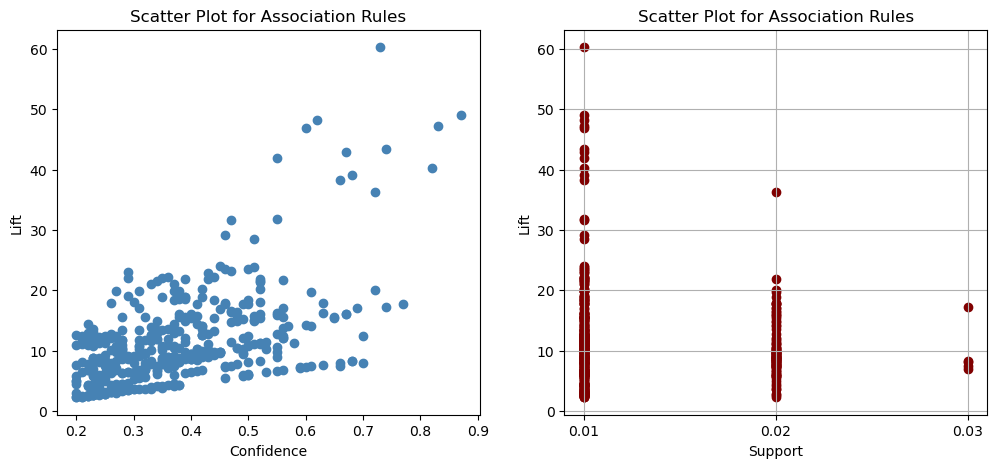

In [80]:
plt.figure(figsize=(12, 5))
plt.subplot(121)
plt.scatter(association_df.Confidence, association_df.Lift, color='steelblue', marker='o')
plt.title('Scatter Plot for Association Rules')
plt.xlabel('Confidence')
plt.ylabel('Lift')
plt.subplot(122)
plt.scatter(association_df.Support, association_df.Lift, color='maroon', marker='o')
plt.title('Scatter Plot for Association Rules')
plt.xlabel('Support')
plt.ylabel('Lift')
plt.xticks([0.01, 0.02, 0.03]) 

# Show the plot
plt.grid()
plt.show()





In [81]:
fig = px.scatter_3d(association_df, x='Support', y='Lift', z='Confidence', 
                    color ='Support',
                    title='3D Scatter Plot for Association Rules',
                    labels={'Support': 'Support', 'Lift': 'Lift', 'Confidence': 'Confidence'},
                    )


fig.show()

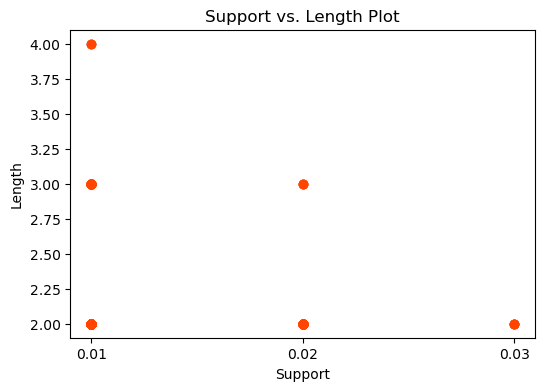

In [82]:
plt.figure( figsize=(6, 4))

# Support vs. Length Plot
plt.scatter(y=association_df.Length,x= association_df.Support, color='orangered', marker='o')
plt.title('Support vs. Length Plot')
plt.ylabel('Length')
plt.xlabel('Support')
plt.xticks([0.01, 0.02, 0.03])
plt.show()


In [83]:
heatmap_data = association_df.head(10).pivot(index='Rule', columns='Support', values='Lift')

heatmap_data

Support,0.01,0.02
Rule,,
"(PAPER CHAIN KIT 50'S CHRISTMAS , 60 CAKE CASES VINTAGE CHRISTMAS)",9.72,NaN
"(60 CAKE CASES VINTAGE CHRISTMAS, SET OF 20 VINTAGE CHRISTMAS NAPKINS)",18.42,NaN
"(60 TEATIME FAIRY CAKE CASES, 72 SWEETHEART FAIRY CAKE CASES)",13.91,NaN
"(60 TEATIME FAIRY CAKE CASES, PACK OF 60 DINOSAUR CAKE CASES)",13.34,NaN
"(60 TEATIME FAIRY CAKE CASES, PACK OF 60 PINK PAISLEY CAKE CASES)",12.53,NaN
"(60 TEATIME FAIRY CAKE CASES, PACK OF 72 RETROSPOT CAKE CASES)",NaN,10.64
"(72 SWEETHEART FAIRY CAKE CASES, PACK OF 72 RETROSPOT CAKE CASES)",9.50,NaN
"(ALARM CLOCK BAKELIKE GREEN, ALARM CLOCK BAKELIKE CHOCOLATE)",16.31,NaN
"(ALARM CLOCK BAKELIKE RED , ALARM CLOCK BAKELIKE CHOCOLATE)",16.08,NaN


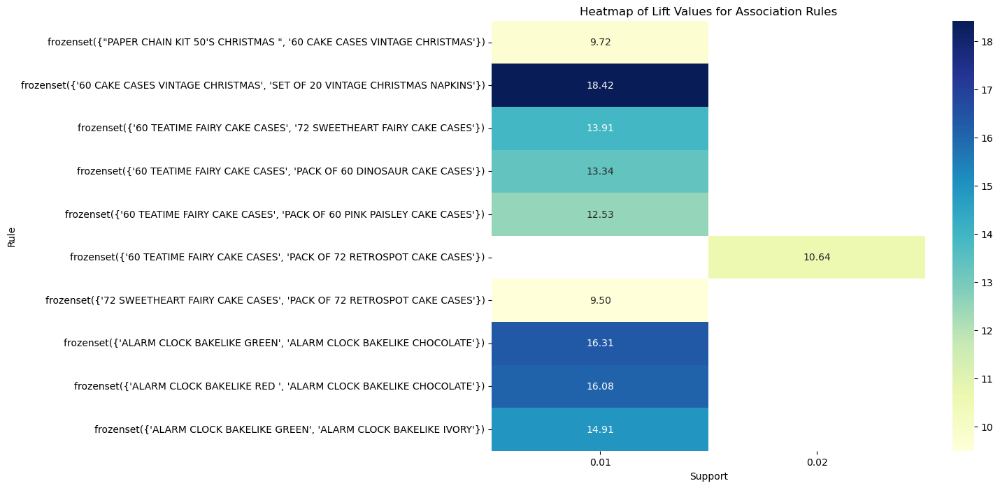

In [84]:

plt.figure(figsize=(10, 8))
sns.heatmap(heatmap_data, annot=True, cmap='YlGnBu', fmt=".2f")
plt.title('Heatmap of Lift Values for Association Rules')
plt.xlabel('Support')
plt.ylabel('Rule')
plt.show()

# Parallel Co-ordinate Plot

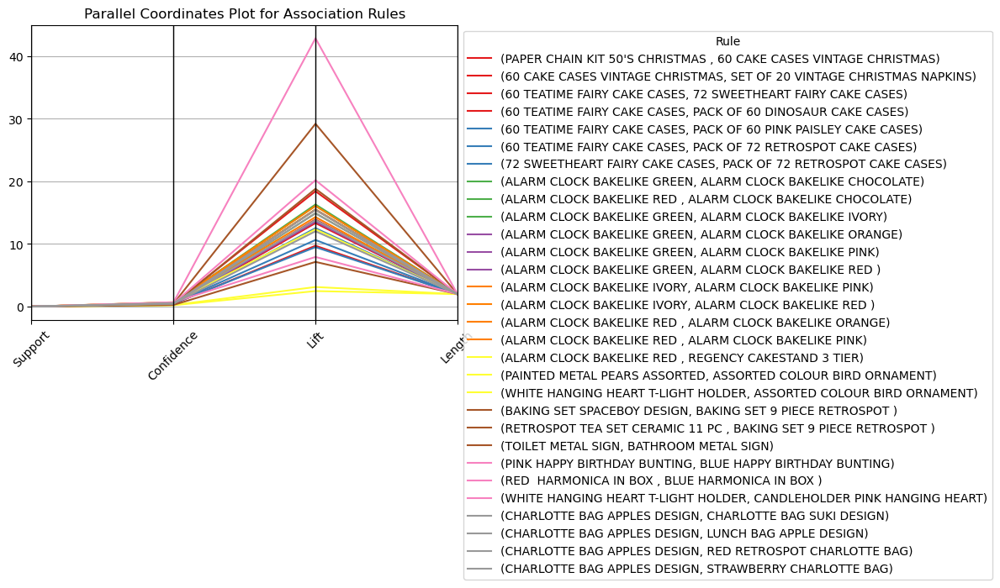

In [85]:
from pandas.plotting import parallel_coordinates
plt.figure(figsize=(12, 6))
parallel_coordinates(association_df.head(30), 'Rule', colormap=plt.get_cmap("Set1"))
plt.title('Parallel Coordinates Plot for Association Rules')
plt.xticks(rotation=45)
plt.legend(title='Rule', bbox_to_anchor=(1, 1))
plt.tight_layout()
plt.show()

# Country-wise Association Rule

In [86]:
df.Country.unique()

array(['United Kingdom', 'France', 'Australia', 'Netherlands', 'Germany',
       'Norway', 'EIRE', 'Switzerland', 'Spain', 'Poland', 'Portugal',
       'Italy', 'Belgium', 'Lithuania', 'Japan', 'Iceland',
       'Channel Islands', 'Denmark', 'Cyprus', 'Sweden', 'Austria',
       'Israel', 'Finland', 'Bahrain', 'Greece', 'Hong Kong', 'Singapore',
       'Lebanon', 'United Arab Emirates', 'Saudi Arabia',
       'Czech Republic', 'Canada', 'Unspecified', 'Brazil', 'USA',
       'European Community', 'Malta', 'RSA'], dtype=object)

In [87]:
UK_basket = df[df.Country == 'United Kingdom']
France_basket =  df[df.Country == 'France']
Australia_basket = df[df.Country == 'Australia']
Netherland_basket =  df[df.Country == 'Netherlands']
Germany_basket = df[df.Country == 'Germany']
Italy_basket =  df[df.Country == 'Italy']
Japan_basket =  df[df.Country == 'Japan']
USA_basket =  df[df.Country == 'USA']
Arab_basket =  df[df.Country == 'Saudi Arabia']
Baharin_basket =  df[df.Country == 'Bahrain']


# UK Basket

In [88]:
InvoiceNo_uk = UK_basket.groupby('InvoiceNo')['Description'].apply(list)
transactions_uk = []

for item in InvoiceNo_uk:
    transactions_uk.append(list(map(str, item)))

rules_uk = apriori(transactions_uk, min_support=0.02, min_confidence=0.2, 
               min_lift=2, min_length=2)
results_uk = list(rules_uk)
results_uk



[RelationRecord(items=frozenset({'ALARM CLOCK BAKELIKE GREEN', 'ALARM CLOCK BAKELIKE RED '}), support=0.024218949519026135, ordered_statistics=[OrderedStatistic(items_base=frozenset({'ALARM CLOCK BAKELIKE GREEN'}), items_add=frozenset({'ALARM CLOCK BAKELIKE RED '}), confidence=0.6364653243847874, lift=15.592404933364124), OrderedStatistic(items_base=frozenset({'ALARM CLOCK BAKELIKE RED '}), items_add=frozenset({'ALARM CLOCK BAKELIKE GREEN'}), confidence=0.5933263816475496, lift=15.592404933364127)]),
 RelationRecord(items=frozenset({'CHARLOTTE BAG PINK POLKADOT', 'RED RETROSPOT CHARLOTTE BAG'}), support=0.020558440452881587, ordered_statistics=[OrderedStatistic(items_base=frozenset({'CHARLOTTE BAG PINK POLKADOT'}), items_add=frozenset({'RED RETROSPOT CHARLOTTE BAG'}), confidence=0.6989869753979739, lift=17.86942328618063), OrderedStatistic(items_base=frozenset({'RED RETROSPOT CHARLOTTE BAG'}), items_add=frozenset({'CHARLOTTE BAG PINK POLKADOT'}), confidence=0.5255712731229598, lift=17.

In [89]:
lift_uk=[]
confidence_uk =[]
support_uk =[]
rule_uk =[]
for item in results_uk:
    rule_uk.append(item[0])
    support_uk.append(item[1])
    confidence_uk.append(item[2][0][2])
    lift_uk.append(item[2][0][3])
association_uk = pd.DataFrame({'Support':support_uk, 'Confidence':confidence_uk, 'Lift':lift_uk, 'Rule':rule_uk})


association_uk = association_uk.assign(Length=association_uk['Rule'].apply(len))
association_uk.sort_values(by='Lift', ascending= False).head()

,Support,Confidence,Lift,Rule,Length
33,0.021154,0.512371,21.611575,"(GREEN REGENCY TEACUP AND SAUCER, PINK REGENCY...",3
5,0.024900,0.603093,19.303899,"(GREEN REGENCY TEACUP AND SAUCER, PINK REGENCY...",2
4,0.023155,0.718626,18.594056,"(GARDENERS KNEELING PAD CUP OF TEA , GARDENERS...",2
1,0.020558,0.698987,17.869423,"(CHARLOTTE BAG PINK POLKADOT, RED RETROSPOT CH...",2
30,0.023708,0.758856,17.775227,"(PINK REGENCY TEACUP AND SAUCER, ROSES REGENCY...",2


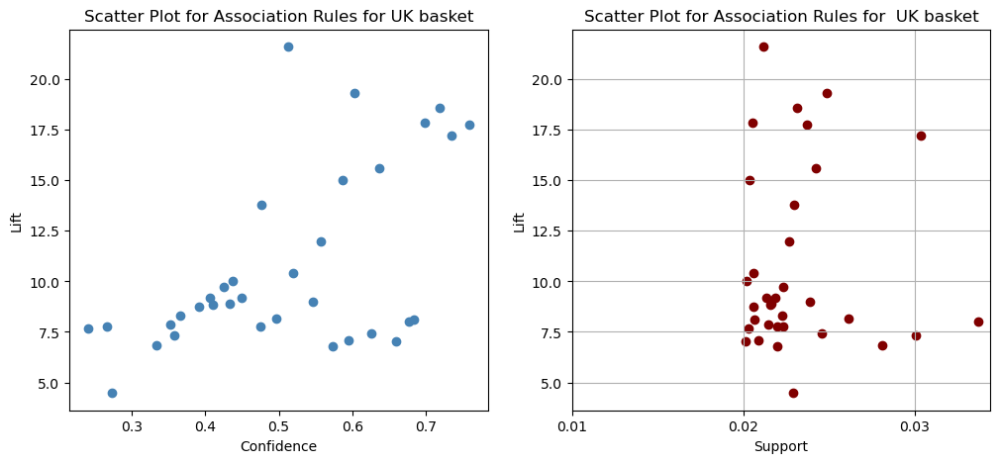

In [90]:
plt.figure(figsize=(12, 5))
plt.subplot(121)
plt.scatter(association_uk.Confidence, association_uk.Lift, color='steelblue', marker='o')
plt.title('Scatter Plot for Association Rules for UK basket')
plt.xlabel('Confidence')
plt.ylabel('Lift')
plt.subplot(122)
plt.scatter(association_uk.Support, association_uk.Lift, color='maroon', marker='o')
plt.title('Scatter Plot for Association Rules for  UK basket')
plt.xlabel('Support')
plt.ylabel('Lift')
plt.xticks([0.01, 0.02, 0.03]) 

# Show the plot
plt.grid()
plt.show()


In [91]:
fig = px.scatter_3d(association_uk, x='Support', y='Lift', z='Confidence', 
                    color ='Support',
                    title='3D Scatter Plot for Association Rules',
                    labels={'Support': 'Support', 'Lift': 'Lift', 'Confidence': 'Confidence'},
                    )


fig.show()

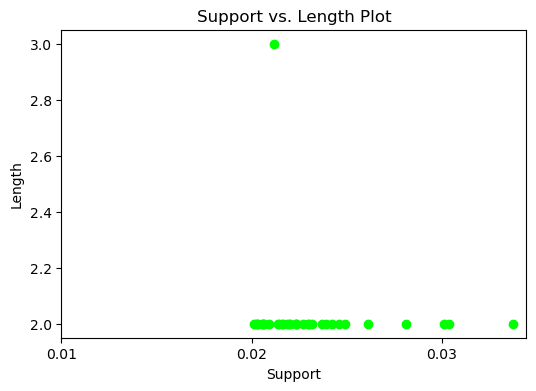

In [92]:
plt.figure( figsize=(6, 4))

# Support vs. Length Plot
plt.scatter(y=association_uk.Length,x= association_uk.Support, color='lime', marker='o')
plt.title('Support vs. Length Plot')
plt.ylabel('Length')
plt.xlabel('Support')
plt.xticks([0.01, 0.02, 0.03])
plt.show()

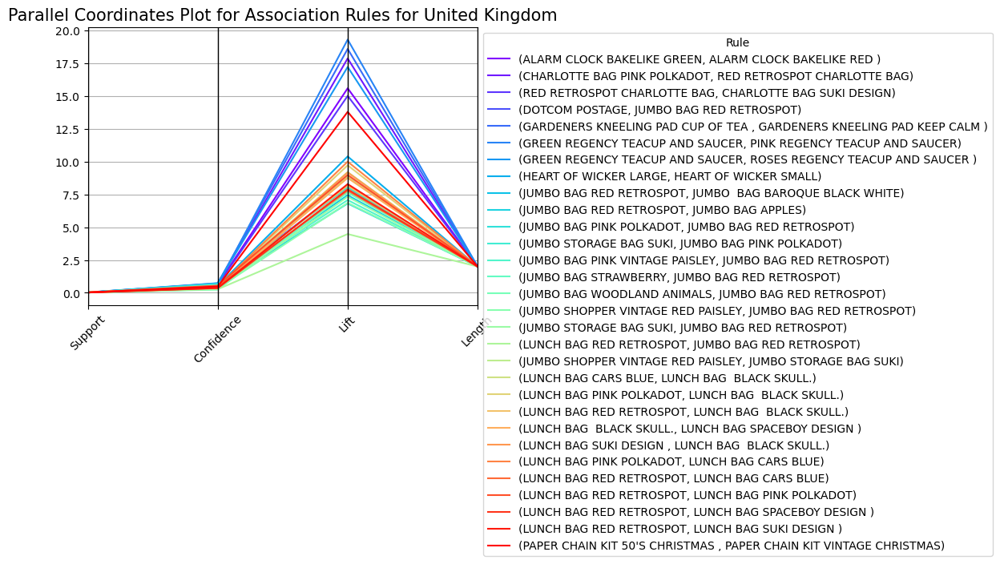

In [93]:
plt.figure(figsize=(12, 6))
parallel_coordinates(association_uk.head(30), 'Rule', colormap=plt.get_cmap("rainbow"))
plt.title('Parallel Coordinates Plot for Association Rules for United Kingdom', fontsize =15)
plt.xticks(rotation=45)
plt.legend(title='Rule', bbox_to_anchor=(1, 1))
plt.tight_layout()
plt.show()

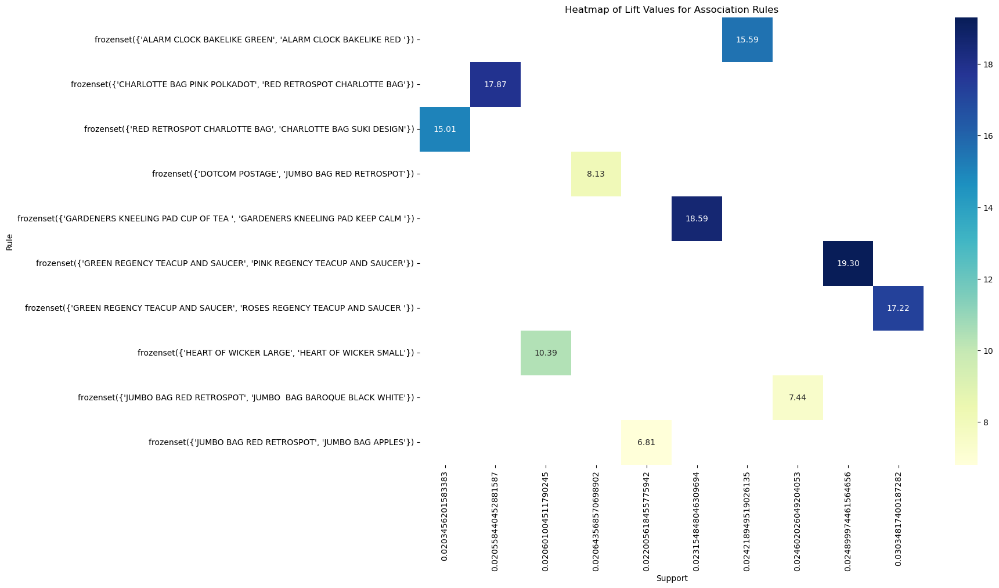

Support,0.020346,0.020558,0.020601,0.020644,0.022006,0.023155,0.024219,0.024602,0.024900,0.030348
Rule,,,,,,,,,,
"(ALARM CLOCK BAKELIKE GREEN, ALARM CLOCK BAKELIKE RED )",NaN,NaN,NaN,NaN,NaN,NaN,15.592405,NaN,NaN,NaN
"(CHARLOTTE BAG PINK POLKADOT, RED RETROSPOT CHARLOTTE BAG)",NaN,17.869423,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
"(RED RETROSPOT CHARLOTTE BAG, CHARLOTTE BAG SUKI DESIGN)",15.012221,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
"(DOTCOM POSTAGE, JUMBO BAG RED RETROSPOT)",NaN,NaN,NaN,8.125053,NaN,NaN,NaN,NaN,NaN,NaN
"(GARDENERS KNEELING PAD CUP OF TEA , GARDENERS KNEELING PAD KEEP CALM )",NaN,NaN,NaN,NaN,NaN,18.594056,NaN,NaN,NaN,NaN
"(GREEN REGENCY TEACUP AND SAUCER, PINK REGENCY TEACUP AND SAUCER)",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,19.303899,NaN
"(GREEN REGENCY TEACUP AND SAUCER, ROSES REGENCY TEACUP AND SAUCER )",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,17.217648
"(HEART OF WICKER LARGE, HEART OF WICKER SMALL)",NaN,NaN,10.394767,NaN,NaN,NaN,NaN,NaN,NaN,NaN
"(JUMBO BAG RED RETROSPOT, JUMBO BAG BAROQUE BLACK WHITE)",NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.438011,NaN,NaN


In [94]:
heatmap_data_uk = association_uk.head(10).pivot(index='Rule', columns='Support', values='Lift')
plt.figure(figsize=(14, 10))
sns.heatmap(heatmap_data_uk, annot=True, cmap='YlGnBu', fmt=".2f")
plt.title('Heatmap of Lift Values for Association Rules')
plt.xlabel('Support')
plt.ylabel('Rule')
plt.show()
heatmap_data_uk 

# France Basket

In [95]:
InvoiceNo_Fr = France_basket.groupby('InvoiceNo')['Description'].apply(list)
transactions_Fr = []

for item in InvoiceNo_Fr:
    transactions_Fr.append(list(map(str, item)))

rules_Fr = apriori(transactions_Fr, min_support=0.05, min_confidence=0.3, 
               min_lift=2, min_length=2)
results_Fr = list(rules_Fr)
results_Fr

[RelationRecord(items=frozenset({'ALARM CLOCK BAKELIKE GREEN', 'ALARM CLOCK BAKELIKE PINK'}), support=0.06290672451193059, ordered_statistics=[OrderedStatistic(items_base=frozenset({'ALARM CLOCK BAKELIKE GREEN'}), items_add=frozenset({'ALARM CLOCK BAKELIKE PINK'}), confidence=0.7435897435897437, lift=8.569871794871796), OrderedStatistic(items_base=frozenset({'ALARM CLOCK BAKELIKE PINK'}), items_add=frozenset({'ALARM CLOCK BAKELIKE GREEN'}), confidence=0.7250000000000001, lift=8.569871794871796)]),
 RelationRecord(items=frozenset({'ALARM CLOCK BAKELIKE GREEN', 'ALARM CLOCK BAKELIKE RED '}), support=0.06724511930585683, ordered_statistics=[OrderedStatistic(items_base=frozenset({'ALARM CLOCK BAKELIKE GREEN'}), items_add=frozenset({'ALARM CLOCK BAKELIKE RED '}), confidence=0.7948717948717949, lift=9.903672903672904), OrderedStatistic(items_base=frozenset({'ALARM CLOCK BAKELIKE RED '}), items_add=frozenset({'ALARM CLOCK BAKELIKE GREEN'}), confidence=0.8378378378378378, lift=9.90367290367290

In [96]:
lift_fr=[]
confidence_fr =[]
support_fr =[]
rule_fr =[]
for item in results_Fr:
    rule_fr.append(item[0])
    support_fr.append(item[1])
    confidence_fr.append(item[2][0][2])
    lift_fr.append(item[2][0][3])
association_fr = pd.DataFrame({'Support':support_fr, 'Confidence':confidence_fr, 'Lift':lift_fr, 'Rule':rule_fr})


association_fr = association_fr.assign(Length=association_fr['Rule'].apply(len))
association_fr.sort_values(by='Lift', ascending= False).head()

,Support,Confidence,Lift,Rule,Length
3,0.054230,0.862069,14.719029,"(CHILDRENS CUTLERY SPACEBOY , CHILDRENS CUTLER...",2
17,0.054230,0.641026,10.190097,"(ALARM CLOCK BAKELIKE GREEN, ALARM CLOCK BAKEL...",3
1,0.067245,0.794872,9.903673,"(ALARM CLOCK BAKELIKE GREEN, ALARM CLOCK BAKEL...",2
19,0.060738,0.717949,9.734540,"(ALARM CLOCK BAKELIKE GREEN, ALARM CLOCK BAKEL...",3
2,0.062907,0.725000,9.033108,"(ALARM CLOCK BAKELIKE RED , ALARM CLOCK BAKELI...",2


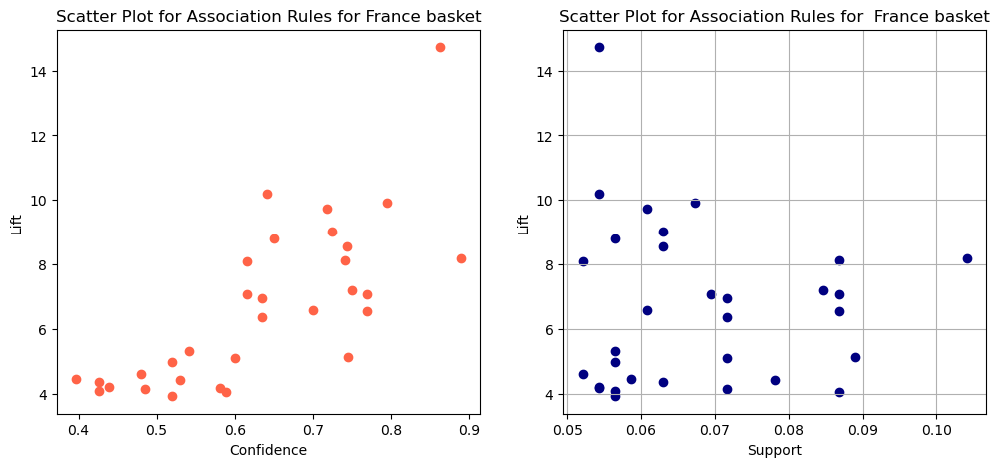

In [97]:
plt.figure(figsize=(12, 5))
plt.subplot(121)
plt.scatter(association_fr.Confidence, association_fr.Lift, color='tomato', marker='o')
plt.title('Scatter Plot for Association Rules for France basket')
plt.xlabel('Confidence')
plt.ylabel('Lift')
plt.subplot(122)
plt.scatter(association_fr.Support, association_fr.Lift, color='navy', marker='o')
plt.title('Scatter Plot for Association Rules for  France basket')
plt.xlabel('Support')
plt.ylabel('Lift')
#plt.xticks([0.01, 0.02, 0.03]) 

plt.grid()
plt.show()

In [98]:
fig = px.scatter_3d(association_fr, x='Support', y='Lift', z='Confidence', 
                    color ='Support',
                    title='3D Scatter Plot for Association Rules',
                    labels={'Support': 'Support', 'Lift': 'Lift', 'Confidence': 'Confidence'},
                    )


fig.show()

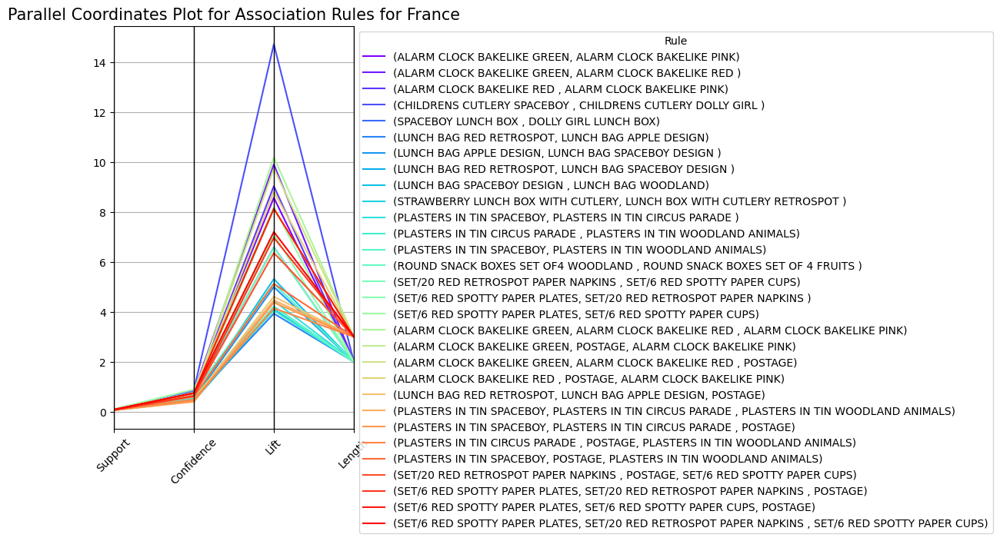

In [99]:
plt.figure(figsize=(12, 7))
parallel_coordinates(association_fr.head(30), 'Rule', colormap=plt.get_cmap("rainbow"))
plt.title('Parallel Coordinates Plot for Association Rules for France', fontsize =15)
plt.xticks(rotation=45)
plt.legend(title='Rule', bbox_to_anchor=(1, 1))
plt.tight_layout()
plt.show()

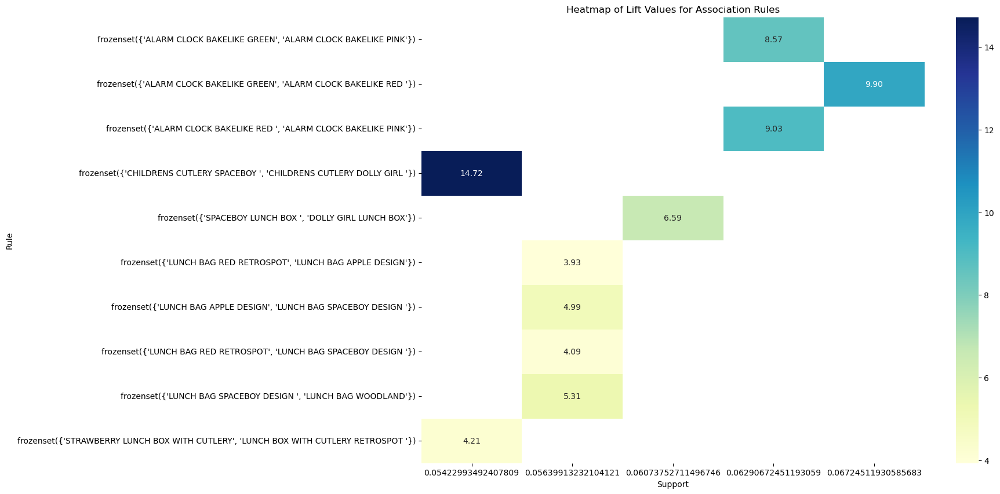

Support,0.054230,0.056399,0.060738,0.062907,0.067245
Rule,,,,,
"(ALARM CLOCK BAKELIKE GREEN, ALARM CLOCK BAKELIKE PINK)",NaN,NaN,NaN,8.569872,NaN
"(ALARM CLOCK BAKELIKE GREEN, ALARM CLOCK BAKELIKE RED )",NaN,NaN,NaN,NaN,9.903673
"(ALARM CLOCK BAKELIKE RED , ALARM CLOCK BAKELIKE PINK)",NaN,NaN,NaN,9.033108,NaN
"(CHILDRENS CUTLERY SPACEBOY , CHILDRENS CUTLERY DOLLY GIRL )",14.719029,NaN,NaN,NaN,NaN
"(SPACEBOY LUNCH BOX , DOLLY GIRL LUNCH BOX)",NaN,NaN,6.585714,NaN,NaN
"(LUNCH BAG RED RETROSPOT, LUNCH BAG APPLE DESIGN)",NaN,3.929836,NaN,NaN,NaN
"(LUNCH BAG APPLE DESIGN, LUNCH BAG SPACEBOY DESIGN )",NaN,4.994167,NaN,NaN,NaN
"(LUNCH BAG RED RETROSPOT, LUNCH BAG SPACEBOY DESIGN )",NaN,4.093579,NaN,NaN,NaN
"(LUNCH BAG SPACEBOY DESIGN , LUNCH BAG WOODLAND)",NaN,5.312943,NaN,NaN,NaN


In [100]:
heatmap_data_fr = association_fr.head(10).pivot(index='Rule', columns='Support', values='Lift')
plt.figure(figsize=(14, 10))
sns.heatmap(heatmap_data_fr, annot=True, cmap='YlGnBu', fmt=".2f")
plt.title('Heatmap of Lift Values for Association Rules')
plt.xlabel('Support')
plt.ylabel('Rule')
plt.show()
heatmap_data_fr

# Germany Basket

In [101]:
InvoiceNo_Gr = Germany_basket.groupby('InvoiceNo')['Description'].apply(list)
transactions_Gr = []

for item in InvoiceNo_Gr:
    transactions_Gr.append(list(map(str, item)))

rules_Gr = apriori(transactions_Gr, min_support=0.02, min_confidence=0.3, 
               min_lift=2, min_length=2)
results_Gr = list(rules_Gr)
results_Gr

[RelationRecord(items=frozenset({'6 RIBBONS RUSTIC CHARM', 'REGENCY CAKESTAND 3 TIER'}), support=0.03316749585406302, ordered_statistics=[OrderedStatistic(items_base=frozenset({'6 RIBBONS RUSTIC CHARM'}), items_add=frozenset({'REGENCY CAKESTAND 3 TIER'}), confidence=0.4, lift=2.977777777777778)]),
 RelationRecord(items=frozenset({'SCANDINAVIAN REDS RIBBONS', '6 RIBBONS RUSTIC CHARM'}), support=0.02321724709784411, ordered_statistics=[OrderedStatistic(items_base=frozenset({'SCANDINAVIAN REDS RIBBONS'}), items_add=frozenset({'6 RIBBONS RUSTIC CHARM'}), confidence=0.6363636363636364, lift=7.674545454545455)]),
 RelationRecord(items=frozenset({'ALARM CLOCK BAKELIKE PINK', 'JAM MAKING SET PRINTED'}), support=0.02155887230514096, ordered_statistics=[OrderedStatistic(items_base=frozenset({'ALARM CLOCK BAKELIKE PINK'}), items_add=frozenset({'JAM MAKING SET PRINTED'}), confidence=0.3939393939393939, lift=5.52431289640592), OrderedStatistic(items_base=frozenset({'JAM MAKING SET PRINTED'}), items

In [102]:
lift_g=[]
confidence_g =[]
support_g =[]
rule_g =[]
for item in results_Gr:
    rule_g.append(item[0])
    support_g.append(item[1])
    confidence_g.append(item[2][0][2])
    lift_g.append(item[2][0][3])
association_Gr = pd.DataFrame({'Support':support_g, 'Confidence':confidence_g, 'Lift':lift_g, 'Rule':rule_g})


association_Gr = association_Gr.assign(Length=association_Gr['Rule'].apply(len))
association_Gr.sort_values(by='Lift', ascending= False).head()

,Support,Confidence,Lift,Rule,Length
161,0.026534,0.800000,25.389474,"(SPACEBOY CHILDRENS BOWL, POSTAGE, SPACEBOY CH...",3
86,0.028192,0.850000,24.407143,"(SPACEBOY CHILDRENS BOWL, SPACEBOY CHILDRENS CUP)",2
163,0.021559,0.764706,23.055882,"(WHITE SPOT RED CERAMIC DRAWER KNOB, POSTAGE, ...",3
82,0.021559,0.684211,21.714681,"(SET OF 12 FAIRY CAKE BAKING CASES, SET OF 12 ...",2
12,0.029851,0.782609,21.450593,"(CHILDRENS CUTLERY SPACEBOY , CHILDRENS CUTLER...",2


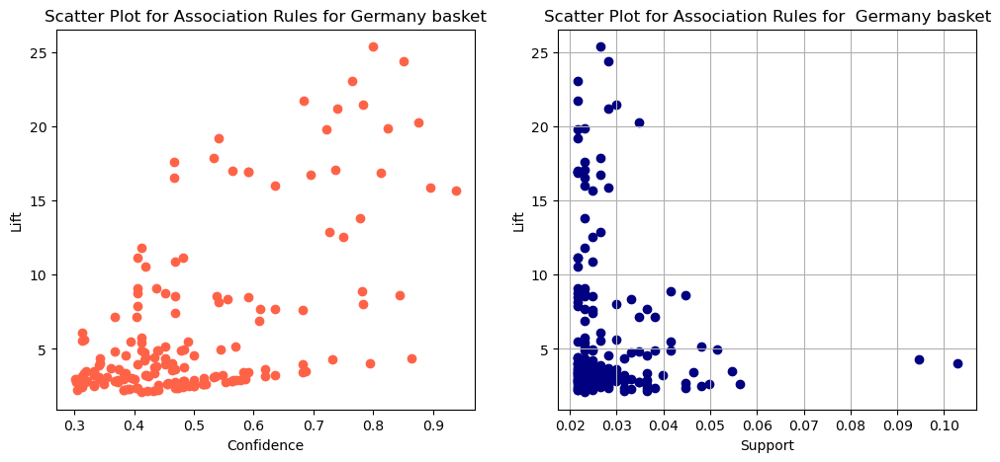

In [103]:
plt.figure(figsize=(12, 5))
plt.subplot(121)
plt.scatter(association_Gr.Confidence, association_Gr.Lift, color='tomato', marker='o')
plt.title('Scatter Plot for Association Rules for Germany basket')
plt.xlabel('Confidence')
plt.ylabel('Lift')
plt.subplot(122)
plt.scatter(association_Gr.Support, association_Gr.Lift, color='navy', marker='o')
plt.title('Scatter Plot for Association Rules for  Germany basket')
plt.xlabel('Support')
plt.ylabel('Lift')
#plt.xticks([0.01, 0.02, 0.03]) 

# Show the plot
plt.grid()
plt.show()

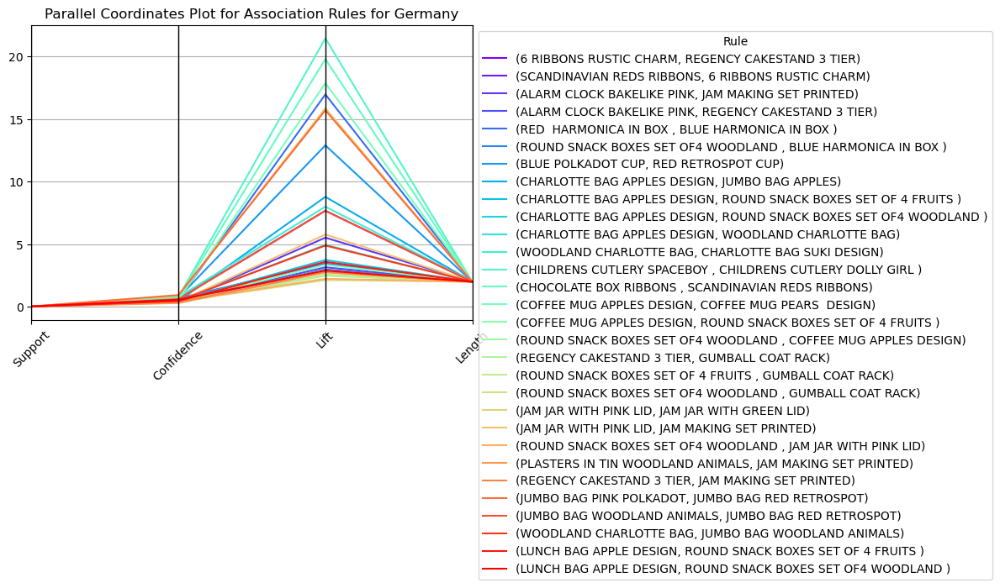

In [104]:
plt.figure(figsize=(12, 6))
parallel_coordinates(association_Gr.head(30), 'Rule', colormap=plt.get_cmap("rainbow"))
plt.title('Parallel Coordinates Plot for Association Rules for Germany')
plt.xticks(rotation=45)
plt.legend(title='Rule', bbox_to_anchor=(1, 1))
plt.tight_layout()
plt.show()

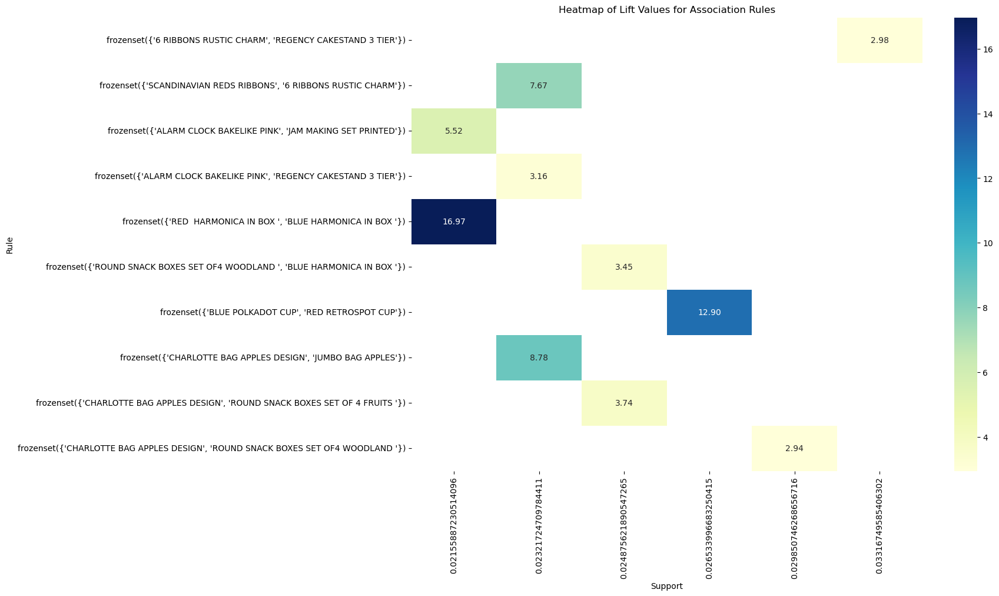

In [105]:
heatmap_data_Gr = association_Gr.head(10).pivot(index='Rule', columns='Support', values='Lift')
plt.figure(figsize=(14, 10))
sns.heatmap(heatmap_data_Gr, annot=True, cmap='YlGnBu', fmt=".2f")
plt.title('Heatmap of Lift Values for Association Rules')
plt.xlabel('Support')
plt.ylabel('Rule')
plt.show()

# Japan Basket

In [106]:
InvoiceNo_jp = Japan_basket.groupby('InvoiceNo')['Description'].apply(list)
transactions_jp = []

for item in InvoiceNo_jp:
    transactions_jp.append(list(map(str, item)))

rules_jp = apriori(transactions_jp, min_support=0.1, min_confidence=0.2, 
               min_lift=2, min_length=2)
results_jp = list(rules_jp)
len(results_jp)

116

In [107]:
lift_jp=[]
confidence_jp =[]
support_jp =[]
rule_jp =[]
for item in results_jp:
    rule_jp.append(item[0])
    support_jp.append(item[1])
    confidence_jp.append(item[2][0][2])
    lift_jp.append(item[2][0][3])
    
association_jp = pd.DataFrame({'Support':support_jp, 'Confidence':confidence_jp, 'Lift':lift_jp, 'Rule':rule_jp})
association_jp = association_jp.assign(Length=association_jp['Rule'].apply(len))
association_jp.sort_values(by='Lift', ascending= False).head()

,Support,Confidence,Lift,Rule,Length
35,0.107143,1.0,9.333333,"(RED RETROSPOT ROUND CAKE TINS, RED RETROSPOT ...",2
86,0.107143,1.0,9.333333,"(RED RETROSPOT ROUND CAKE TINS, RED SPOTTY BIS...",3
111,0.107143,1.0,9.333333,"(SET 3 RETROSPOT TEA,COFFEE,SUGAR, RED RETROSP...",4
44,0.107143,1.0,9.333333,"(SET OF 4 KNICK KNACK TINS LEAF, TRADITIONAL K...",2
87,0.107143,1.0,9.333333,"(RED RETROSPOT ROUND CAKE TINS, SET 3 RETROSPO...",3


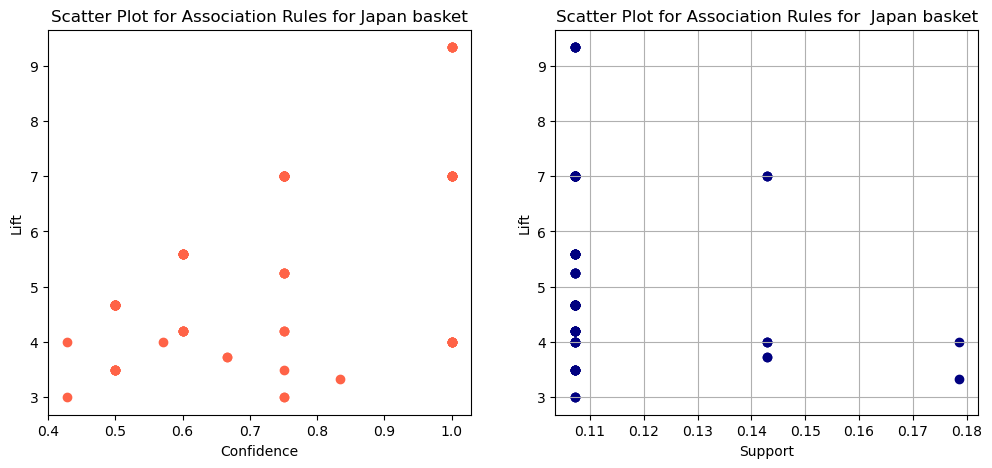

In [108]:
plt.figure(figsize=(12, 5))
plt.subplot(121)
plt.scatter(association_jp.Confidence, association_jp.Lift, color='tomato', marker='o')
plt.title('Scatter Plot for Association Rules for Japan basket')
plt.xlabel('Confidence')
plt.ylabel('Lift')
plt.subplot(122)
plt.scatter(association_jp.Support, association_jp.Lift, color='navy', marker='o')
plt.title('Scatter Plot for Association Rules for  Japan basket')
plt.xlabel('Support')
plt.ylabel('Lift')
#plt.xticks([0.01, 0.02, 0.03]) 

# Show the plot
plt.grid()
plt.show()

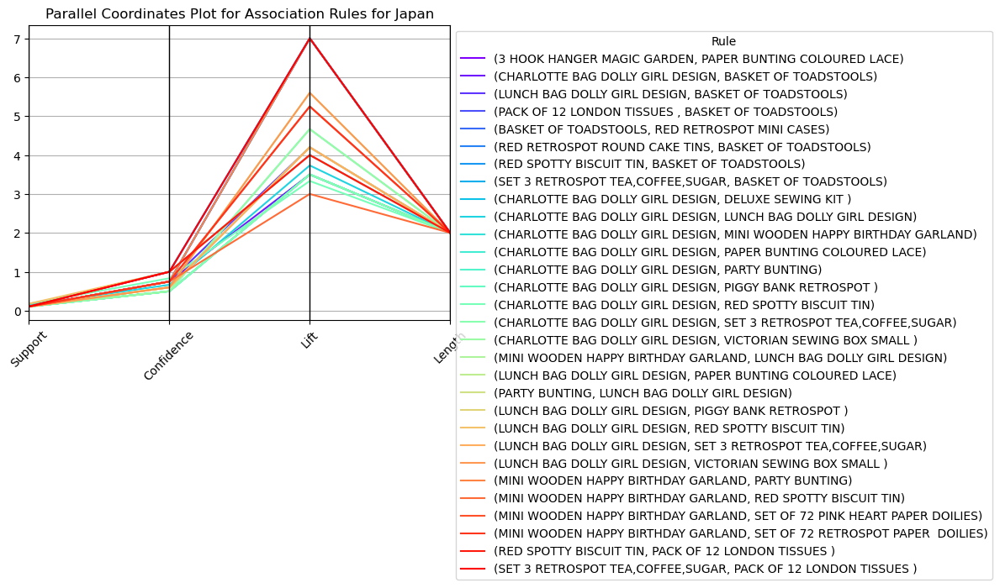

In [109]:
plt.figure(figsize=(12, 6))
parallel_coordinates(association_jp.head(30), 'Rule', colormap=plt.get_cmap("rainbow"))
plt.title('Parallel Coordinates Plot for Association Rules for Japan')
plt.xticks(rotation=45)
plt.legend(title='Rule', bbox_to_anchor=(1, 1))
plt.tight_layout()
plt.show()

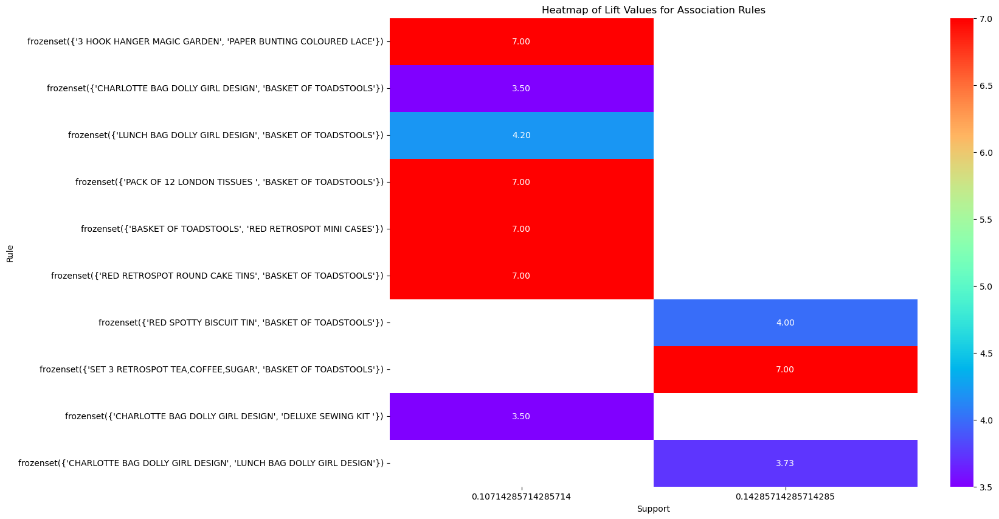

In [110]:
heatmap_data_jp = association_jp.head(10).pivot(index='Rule', columns='Support', values='Lift')
plt.figure(figsize=(14, 10))
sns.heatmap(heatmap_data_jp, annot=True, cmap='rainbow', fmt=".2f")
plt.title('Heatmap of Lift Values for Association Rules')
plt.xlabel('Support')
plt.ylabel('Rule')
plt.show()

# Bahrain basket:

In [111]:
InvoiceNo_Baharin = Baharin_basket.groupby('InvoiceNo')['Description'].apply(list)
transactions_B = []

for item in InvoiceNo_Baharin:
    transactions_B.append(list(map(str, item)))

rules_Bahrain = apriori(transactions_B, min_support=0.01, min_confidence=0.2, 
               min_lift=2, min_length=2)
results_Bahrain = list(rules_Bahrain)
len(results_Bahrain)


8177

In [112]:
lift_b=[]
confidence_b =[]
support_b =[]
rule_b =[]
for item in results_Bahrain:
    rule_b.append(item[0])
    support_b.append(item[1])
    confidence_b.append(item[2][0][2])
    lift_b.append(item[2][0][3])
    
association_Bahrain = pd.DataFrame({'Support':support_b, 'Confidence':confidence_b, 'Lift':lift_b, 'Rule':rule_b})
association_Bahrain = association_Bahrain.assign(Length=association_Bahrain['Rule'].apply(len))
association_Bahrain.sort_values(by='Lift', ascending= False).head()

,Support,Confidence,Lift,Rule,Length
0,0.25,1.0,4.0,"(CERAMIC CAKE STAND + HANGING CAKES, CERAMIC C...",2
5422,0.25,1.0,4.0,"(S/4 PINK FLOWER CANDLES IN BOWL, NOVELTY BISC...",7
5435,0.25,1.0,4.0,"(NOVELTY BISCUITS CAKE STAND 3 TIER, STRAWBERR...",7
5434,0.25,1.0,4.0,"(S/4 PINK FLOWER CANDLES IN BOWL, NOVELTY BISC...",7
5433,0.25,1.0,4.0,"(S/4 PINK FLOWER CANDLES IN BOWL, NOVELTY BISC...",7


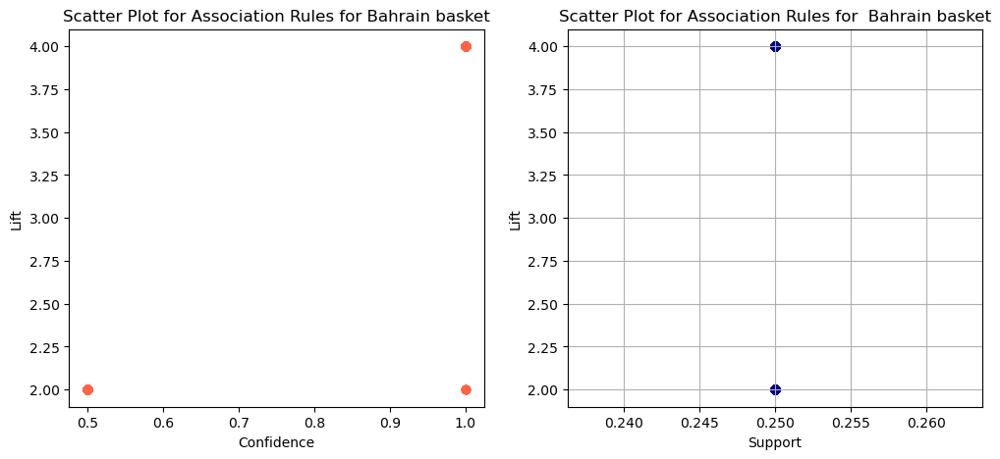

In [113]:
plt.figure(figsize=(12, 5))
plt.subplot(121)
plt.scatter(association_Bahrain.Confidence, association_Bahrain.Lift, color='tomato', marker='o')
plt.title('Scatter Plot for Association Rules for Bahrain basket')
plt.xlabel('Confidence')
plt.ylabel('Lift')
plt.subplot(122)
plt.scatter(association_Bahrain.Support, association_Bahrain.Lift, color='navy', marker='o')
plt.title('Scatter Plot for Association Rules for  Bahrain basket')
plt.xlabel('Support')
plt.ylabel('Lift')
#plt.xticks([0.01, 0.02, 0.03]) 

# Show the plot
plt.grid()
plt.show()

In [114]:
fig = px.scatter_3d(association_Bahrain, x='Lift', y='Length', z='Confidence', 
                    color ='Support',
                    title='3D Scatter Plot for Association Rules',
                    labels={'Support': 'Support', 'Lift': 'Lift', 'Confidence': 'Confidence'},
                    )


fig.show()

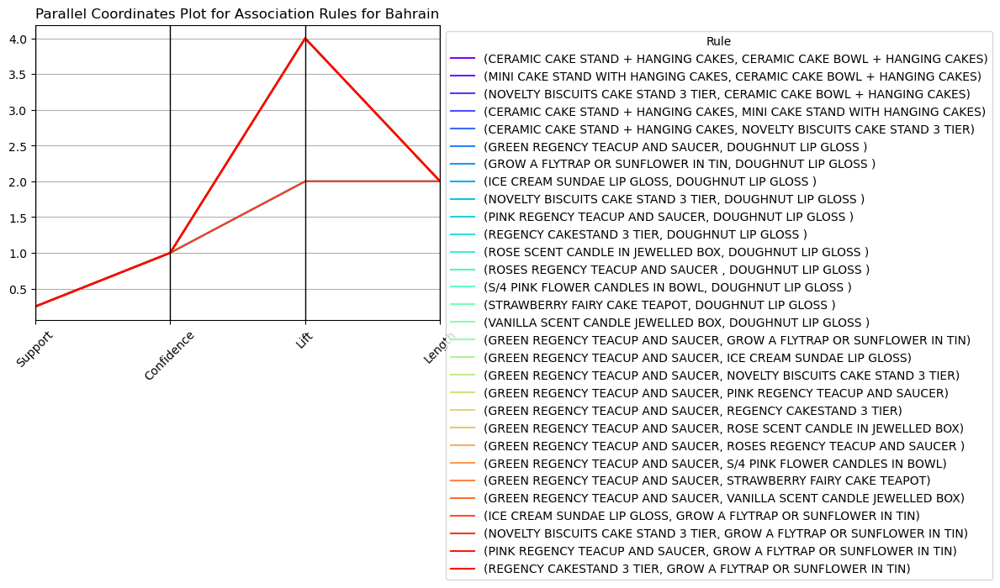

In [115]:
plt.figure(figsize=(12, 6))
parallel_coordinates(association_Bahrain.head(30), 'Rule', colormap=plt.get_cmap("rainbow"))
plt.title('Parallel Coordinates Plot for Association Rules for Bahrain')
plt.xticks(rotation=45)
plt.legend(title='Rule', bbox_to_anchor=(1, 1))
plt.tight_layout()
plt.show()

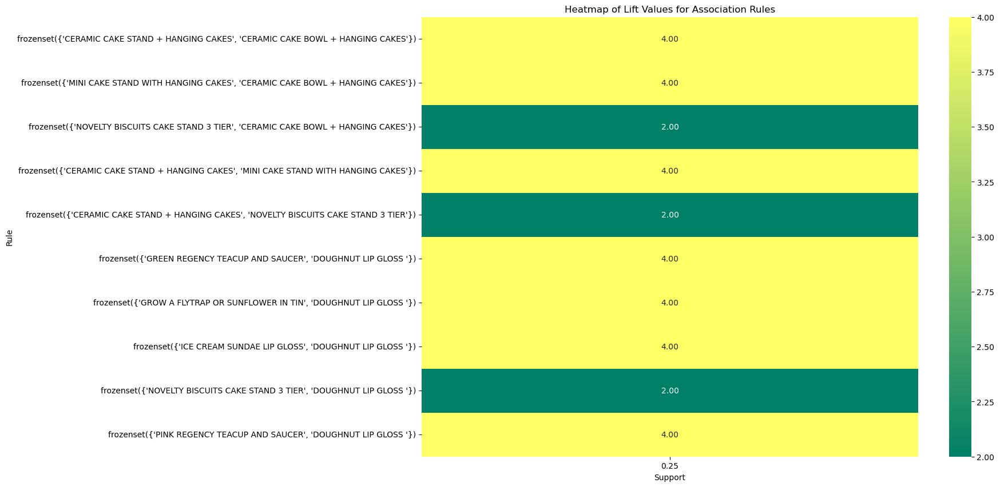

In [116]:
heatmap_data_Bahrain = association_Bahrain.head(10).pivot(index='Rule', columns='Support', values='Lift')
plt.figure(figsize=(14, 10))
sns.heatmap(heatmap_data_Bahrain, annot=True, cmap='summer', fmt=".2f")
plt.title('Heatmap of Lift Values for Association Rules')
plt.xlabel('Support')
plt.ylabel('Rule')
plt.show()

# Saudi Arab Basket

In [117]:
InvoiceNo_Arab = Arab_basket.groupby('InvoiceNo')['Description'].apply(list)
transactions_A = []

for item in InvoiceNo_Arab:
    transactions_A.append(list(map(str, item)))
rules_A = apriori(transactions_A, min_support=0.01, min_confidence=0.2, 
               min_lift=2, min_length=2)
results_A = list(rules_A)
len(results_A)

494

In [118]:
lift_a=[]
confidence_a =[]
support_a =[]
rule_a =[]
for item in results_A:
    rule_a.append(item[0])
    support_a.append(item[1])
    confidence_a.append(item[2][0][2])
    lift_a.append(item[2][0][3])
    
association_Arab = pd.DataFrame({'Support':support_a, 'Confidence':confidence_a, 'Lift':lift_a, 'Rule':rule_a})
association_Arab = association_Arab.assign(Length=association_Arab['Rule'].apply(len))
association_Arab.sort_values(by='Lift', ascending= False).head()

,Support,Confidence,Lift,Rule,Length
0,0.5,1.0,2.0,"(ASSORTED BOTTLE TOP MAGNETS , GLASS JAR MARM...",2
339,0.5,1.0,2.0,"(GLASS JAR DAISY FRESH COTTON WOOL, PLASTERS I...",5
337,0.5,1.0,2.0,"(GLASS JAR PEACOCK BATH SALTS, GLASS JAR DAISY...",5
336,0.5,1.0,2.0,"(GLASS JAR PEACOCK BATH SALTS, GLASS JAR DAISY...",5
335,0.5,1.0,2.0,"(GLASS JAR PEACOCK BATH SALTS, GLASS JAR DAISY...",5


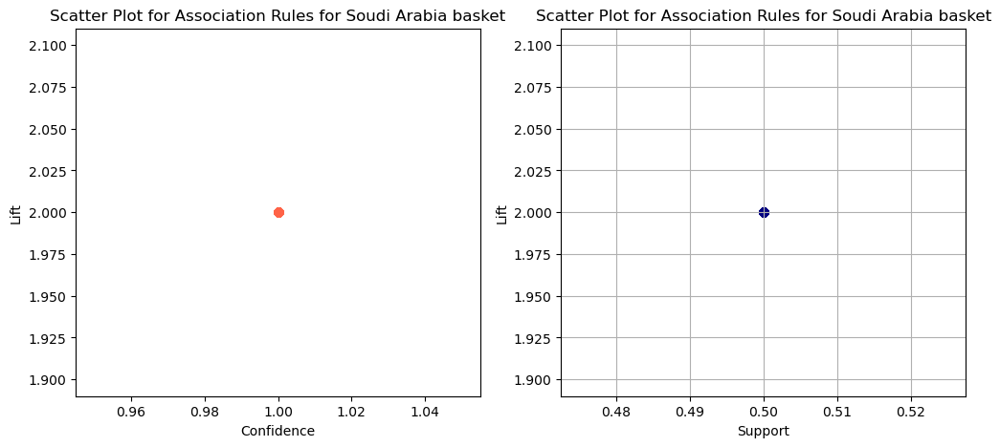

In [119]:
plt.figure(figsize=(12, 5))
plt.subplot(121)
plt.scatter(association_Arab.Confidence, association_Arab.Lift, color='tomato', marker='o')
plt.title('Scatter Plot for Association Rules for Soudi Arabia basket')
plt.xlabel('Confidence')
plt.ylabel('Lift')
plt.subplot(122)
plt.scatter(association_Arab.Support, association_Arab.Lift, color='navy', marker='o')
plt.title('Scatter Plot for Association Rules for Soudi Arabia basket')
plt.xlabel('Support')
plt.ylabel('Lift')
#plt.xticks([0.01, 0.02, 0.03]) 

# Show the plot
plt.grid()
plt.show()

In [120]:
fig = px.scatter_3d(association_Arab, x='Lift', y='Length', z='Confidence', 
                    color ='Support',
                    title='3D Scatter Plot for Association Rules',
                    labels={'Support': 'Support', 'Lift': 'Lift', 'Confidence': 'Confidence'},
                    )


fig.show()

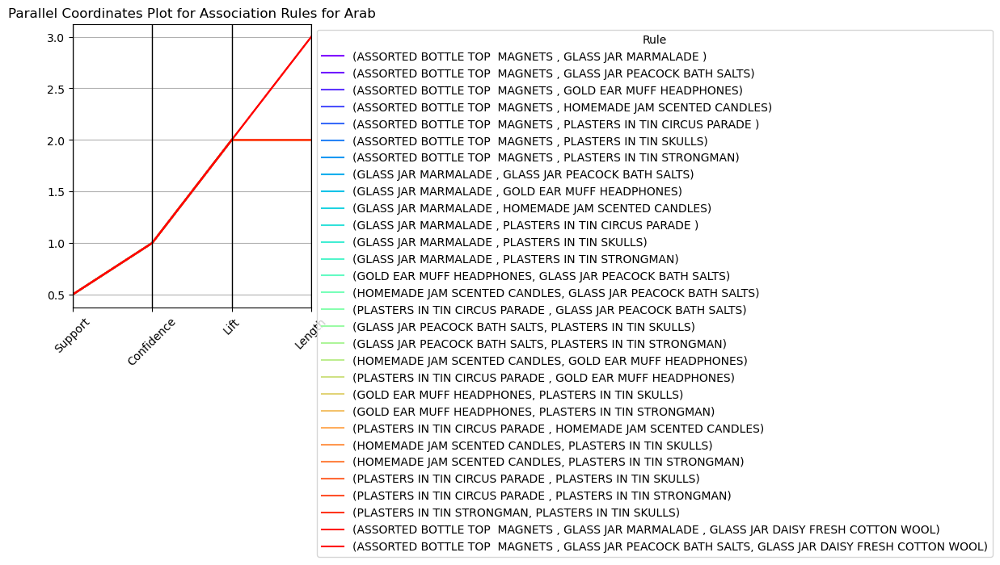

In [121]:
plt.figure(figsize=(12, 6))
parallel_coordinates(association_Arab.head(30), 'Rule', colormap=plt.get_cmap("rainbow"))
plt.title('Parallel Coordinates Plot for Association Rules for Arab')
plt.xticks(rotation=45)
plt.legend(title='Rule', bbox_to_anchor=(1, 1))
plt.tight_layout()
plt.show()

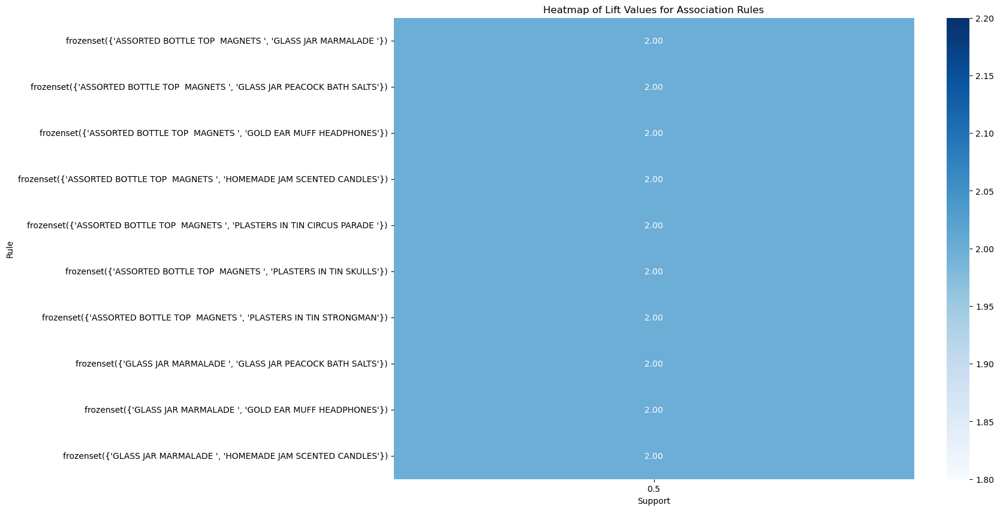

Support,0.5
Rule,
"(ASSORTED BOTTLE TOP MAGNETS , GLASS JAR MARMALADE )",2.0
"(ASSORTED BOTTLE TOP MAGNETS , GLASS JAR PEACOCK BATH SALTS)",2.0
"(ASSORTED BOTTLE TOP MAGNETS , GOLD EAR MUFF HEADPHONES)",2.0
"(ASSORTED BOTTLE TOP MAGNETS , HOMEMADE JAM SCENTED CANDLES)",2.0
"(ASSORTED BOTTLE TOP MAGNETS , PLASTERS IN TIN CIRCUS PARADE )",2.0
"(ASSORTED BOTTLE TOP MAGNETS , PLASTERS IN TIN SKULLS)",2.0
"(ASSORTED BOTTLE TOP MAGNETS , PLASTERS IN TIN STRONGMAN)",2.0
"(GLASS JAR MARMALADE , GLASS JAR PEACOCK BATH SALTS)",2.0
"(GLASS JAR MARMALADE , GOLD EAR MUFF HEADPHONES)",2.0


In [123]:
heatmap_data_Arab = association_Arab.head(10).pivot(index='Rule', columns='Support', values='Lift')
plt.figure(figsize=(14, 10))
sns.heatmap(heatmap_data_Arab, annot=True, cmap='Blues', fmt=".2f")
plt.title('Heatmap of Lift Values for Association Rules')
plt.xlabel('Support')
plt.ylabel('Rule')
plt.show()
heatmap_data_Arab

# Conclusion:

### - Upon sorting the countries based on Total Price, it's intriguing to note that the `UK` takes the lead in revenue, followed by `Netherlands`, `EIRE`(Republic of Ireland), `Germany` and `France` in the top ranks. This indicates a robust customer base and a healthy transaction volume in these nations. On the other end of the spectrum, `Bahrain` and `Saudi Arabia` exhibit lower transaction volumes, suggesting areas that might warrant further exploration for potential growth.

### - There are 38 countries in the dataset. Digging deeper into the analysis, I've focused on countries with varying revenue profiles: the UK, Germany, France, Japan, Bahrain, and Saudi Arabia. These countries were selected randomly. However, UK, Germany, France are in the top 5 revinue generating countries and Bahrain, and Saudi Arabia are in the end of the spectrum.

### - The presence of high lift values with low support, coupled with a confidence of 100%, suggests the occurrence of strong associations among specific items in the transaction data. 